In [1]:
import pandas as pd
import numpy as np
import string as s
import seaborn as sns
import random
import math
# import tables
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import style, colors
from itertools import groupby
import matplotlib.patches as patches
from matplotlib import gridspec
import scipy.stats as stats
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster, fclusterdata, leaves_list
from scipy.spatial.distance import pdist
from scipy.ndimage.interpolation import shift
# matplotlib.style.use('ggplot')
# %matplotlib inline
# matplotlib.rcParams['figure.figsize'] = (32, 6)
# matplotlib.rcParams['figure.facecolor'] = 'white'
import mpl_toolkits.mplot3d.axes3d as p3
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets.samples_generator import make_swiss_roll
matplotlib.style.use('ggplot')
%matplotlib inline

vcf files used for noncoding anaylsis are here:
/projects/mwarren_prj/mwarren_prj_results/VDB-241/pog500_annotated_all_biopsies.vcf
/projects/mwarren_prj/mwarren_prj_results/VDB-241/pog500_modifer_all_biopsies.vcf



only look at biop1 at this time, some pogs with multiple biopsies, there may be FFPE samples etc. the number of snvs may not be comparable

further development to incude patient count in addition to mutation count, this is to differentiate mutations from multiple patient or from a single patient with kataegis mutation shower

also aim to include type of mutations, and gene annotations

In [37]:
wkdir = '/projects/trans_scratch/validations/workspace/szong/NC_500/CNC_POG500/'
# cohorts = ["NC_CA", "NC_CHOL", "NC_COLO", "NC_LUNG", "NC_OV", "NC_PAAD", "NC_SARC", "NC_SECR", "NC_SKCM"]
mfold = 8
wsize = 1000
stride = 100
centromere_flank = 5000
hotspot_percent = 0.001 # result in 3Mb hotspot region will implement later, has drawbacks, ditch this idea for now

159 tert mutations in a region of 51kb, this can be used to sanity check

pro-processing mutations: pick only modifier mutations, exclude mutations at centromere. convert X>23, Y>24, remove other unplaced contigs and MT

In [3]:
# f1 = '/projects/mwarren_prj/mwarren_prj_results/VDB-241/pog500_modifer_all_biopsies.vcf'
f1 = '/projects/mwarren_prj/mwarren_prj_results/VDB-241/all_annotated.tsv'
df1 = pd.read_csv(f1, sep='\t',dtype={'chrom': str}) # mixed type of data type: chr
df1 = df1[df1.chrom != 'MT']
new_chr = df1.chrom.str.replace('X', '23').replace('Y', '24')
df1.chrom = new_chr
df1.tail()

,chrom,pos,ref,alt,qual,af_tumour,tumour_ref_count,tumour_alt_count,tumour_total_count,library_name,pog_id,gene_id,transcript_id,aa_change,effect,impact,cancer_stage,analysis_cohort
8142676,24,28813373,T,C,24;0.96,0.220339,46,13,59,P02455,POG927,NaN,NaN,NaN,intergenic_region,MODIFIER,Metastatic,SKCM
8142677,24,58838741,CTTCCATTCGAATCCA,C,33,0.333333,11,9,27,P01828,POG655,NaN,NaN,NaN,intergenic_region,MODIFIER,Metastatic,PAAD
8142678,24,58855248,CA,C,31,0.129032,21,4,31,P01602,POG615,NaN,NaN,NaN,intergenic_region,MODIFIER,Metastatic,SARC
8142679,24,59004520,A,AG,60,0.215385,13,14,65,P01602,POG615,CTBP2P1,ENST00000431853,NaN,downstream_gene_variant,MODIFIER,Metastatic,SARC
8142680,24,59022337,G,C,51;0.907,0.298246,40,17,57,P01062,POG386,NaN,NaN,NaN,intergenic_region,MODIFIER,Primary,LUNG


In [4]:
df1.chrom.unique()

array(['1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19',
       '2', '20', '21', '22', '3', '4', '5', '6', '7', '8', '9', '23',
       '24'], dtype=object)

In [5]:
# df1 = df1.query('impact == "{}"'.format('MODIFIER'))

In [6]:
df1.shape

(8142379, 18)

exclude centromeres

In [7]:
f3 = '/home/szong/projects/resource/centromere.pos.txt'
centromeres = pd.read_csv(f3, sep='\t')
centromeres.head(2)

,chr,start,end,arm,annot
0,1,121100000,124300000,p11.1,acen
1,1,124300000,128000000,q11,acen


In [8]:
def get_centromere_region(centromeres):
    coords = []
    for chrm in centromeres.chr.unique():
        if chrm == 'X':
            chrm = '23'
        if chrm == 'Y':
            chrm = '24'
        dftmp = (centromeres.query('chr == "{}"'.format(chrm))[['start', 'end']])
        cen_start = dftmp.min().min() - centromere_flank
        cen_end = dftmp.max().max() + centromere_flank
        coords.append([chrm, cen_start, cen_end])
    cent_coords = pd.DataFrame(coords)
    cent_coords.columns = ['chr', 'start', 'end']
    return cent_coords

cent_regions = get_centromere_region(centromeres).iloc[:-1, ].set_index('chr')
cent_regions.head(2)

,start,end
chr,,
1,121095000,128005000
10,38795000,42105000


In [9]:
def remove_cent_variants(variants, cent_regions):
    # removed variants at centromere =-5kb
    df_filtered = pd.DataFrame()
    for chrm in variants.chrom.unique():
        chrm = int(chrm)
        chr_df = df1.query('chrom == "{}"'.format(chrm))
        dftmp = chr_df[~((chr_df.pos > cent_regions.loc[chrm,'start']) & (chr_df.pos < cent_regions.loc[chrm,'end']))]
        df_filtered = pd.concat([df_filtered, dftmp])
    return df_filtered

In [10]:
df_filtered = remove_cent_variants(df1, cent_regions)

In [11]:
df_filtered.shape

(8037449, 18)

In [12]:
print('libraries in total: {}'.format(df_filtered.library_name.nunique()))
print('number of pogs: {}'.format(df_filtered.pog_id.nunique()))
df_filtered.shape

libraries in total: 570
number of pogs: 570


(8037449, 18)

In [59]:
df_filtered.chrom.unique()

array(['1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19',
       '2', '20', '21', '22', '3', '4', '5', '6', '7', '8', '9', '23',
       '24'], dtype=object)

# plot cancer type distribution

In [ ]:
f_pogtable = '/projects/trans_scratch/validations/workspace/szong/EXPANDS_500/POG500_analysis_groups_V3_from_Erin.xls'
df_pt = pd.read_excel(f_pogtable, sheetname='POG500_biop_details')
df_pt.head(2)

In [ ]:
df_mod = pd.DataFrame(df_filtered.library_name.value_counts())

In [ ]:
dfm = pd.merge(df_pt, df_mod, left_on='t_dna_lib', right_index=True)
dfm.head(2)

dfn = dfm[['ID', 't_dna_lib', 'CANCER TYPE', 'ANALYSIS COHORT', 'library_name']].sort_values('library_name', ascending=False)
dfn.head(2)

In [ ]:
with plt.style.context("seaborn-whitegrid"):
    plt.rcParams["axes.edgecolor"] = "0.15"
    plt.rcParams["axes.linewidth"]  = 1.25
    fig = plt.figure(facecolor='w', figsize=(12,4))
    ax = fig.add_subplot(111)
    sns.boxplot('ANALYSIS COHORT', 'library_name',  data=dfn)
    sns.swarmplot('ANALYSIS COHORT', 'library_name', data=dfn)
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=90)
    ax.set_xlabel('')
    ax.set_ylabel('')
#     ax.set_ylim(0, 30000)
of = '/projects/trans_scratch/validations/workspace/szong/NC_500/num_non_coding_mutations.png'
plt.savefig(of, bbox_inches='tight', dpi=200)

In [ ]:
df_filtered.library_name.value_counts().hist(bins=100)

# of = '/projects/trans_scratch/validations/workspace/szong/EXPANDS_500/number_strelka_modifier_mutations_distribution.png'
# %time plt.savefig(of, bbox_inches='tight',dpi=200)

# Subset samples into cohorts

In [26]:
fmeta = '/projects/trans_scratch/validations/workspace/szong/EXPANDS_500/POG500_analysis_groups_V3_from_Erin.xls'
dfmeta = pd.read_excel(fmeta, sheetname= 'POG500_biop_details' )
dfmeta.head(2)

,ID,Biopsy #,Nonstandard,t_name,t_dna_lib,t_rna_lib,biopsy_date,n_name,n_dna_lib,a1_name,...,c_name,c_dna_lib,c_rna_lib,CANCER TYPE,HISTOLOG. TYPE,BIOPSY SITE,MET OR PRIMARY,ANALYSIS COHORT,PRIMARY SITE,Comment
0,POG001,1,NaN,biop1,A10504,A10506,2012-07-10,blood1,A10501,arch1,...,NaN,NaN,NaN,Colorectal Adenocarcinoma,COAD,Liver,Metastatic,COLO,Colon,NaN
1,POG002,1,NaN,biop1,A10512,A10513,2012-08-28,blood1,A10511,arch1,...,NaN,NaN,NaN,Breast Invasive Ductal Carcinoma,IDC,Liver,Metastatic,BRCA,Breast,NaN


In [27]:
cohorts = dfmeta[['t_dna_lib', 'ANALYSIS COHORT']]['ANALYSIS COHORT'].value_counts().index.tolist()[:10]

In [28]:
for ch in cohorts:
    print(ch)

BRCA
COLO
LUNG
SARC
MISC
PAAD
OV
CHOL
SECR
SKCM


In [29]:
# brca_libs = dfmeta[dfmeta['ANALYSIS COHORT'] == 'BRCA']['t_dna_lib'].tolist()
brca_libs = dfmeta[dfmeta['ANALYSIS COHORT'] == 'COLO']['t_dna_lib'].tolist()

In [30]:
dfsub = df_filtered[df_filtered.library_name.isin(brca_libs)]

In [31]:
dfsub.shape

(1413638, 18)

In [32]:
wkdir = '{}NC_COLO/'.format(wkdir)

In [20]:
wkdir

'/projects/trans_scratch/validations/workspace/szong/NC_500/'

# figure out mutation rate per chromosome

In [21]:
wkdir = '/projects/trans_scratch/validations/workspace/szong/NC_500/CNC_POG500/'

In [13]:
# analyzed all pog 
dfsub = df_filtered.copy()

In [14]:
num_muts = dfsub.groupby('chrom').count()['pos'].to_frame()

In [15]:
num_muts.head(2)

,pos
chrom,
1,586619
10,365160


In [16]:
f2_1 = '/home/szong/projects/resource/chrominfo.txt'
df2_1 = pd.read_csv(f2_1, sep='\t', usecols=['#chrom', 'size'])
df2_1['chr'] = df2_1['#chrom'].apply(lambda x: x.replace('chr', ''))
chr_sizes = df2_1.set_index('chr').drop('#chrom', axis=1)
chr_sizes = chr_sizes.reset_index().replace('X', '23').replace('Y', '24').iloc[:24,].set_index('chr')
chr_sizes.head(2)

,size
chr,
1,249250621
2,243199373


In [17]:
f2 = '/home/szong/projects/resource/hg19a_chromosome_effective_sizes.txt'
chr_effective_sizes = pd.read_csv(f2, sep='\t')
chr_effective_sizes['chrxx'] = chr_effective_sizes.chr.replace('X', '23').replace('Y', '24')
chr_effective_sizes = chr_effective_sizes.set_index('chrxx').drop('chr', axis=1)
chr_effective_sizes.head(2)

,Effective_size
chrxx,
1,225280621
2,238204518


In [18]:
mdf = pd.merge(num_muts, chr_effective_sizes, left_index=True, right_index=True)

In [19]:
mdf.head(2)

,pos,Effective_size
1,586619,225280621
10,365160,131314738


In [20]:
# mut_rate per million bases
mdf['chr_mut_rate'] = mdf.pos/mdf['Effective_size']*1e6
chr_mut_rates = mdf.sort_values('chr_mut_rate', ascending=False)#.drop('MT')

In [21]:
chr_mut_rates.rename(columns={'pos':'num_mutations'}, inplace=True)

In [69]:
of2 = '{}pog_mut_rate.txt'.format(wkdir)
chr_mut_rates.to_csv(of2)

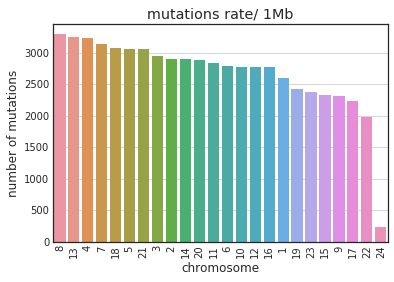

In [70]:
# look at general mutation rate

with plt.style.context("seaborn-whitegrid"):
    plt.rcParams["axes.edgecolor"] = "0.15"
    plt.rcParams["axes.linewidth"]  = 1.25
    fig = plt.figure(facecolor='w')
    ax1 = fig.add_subplot(111)
    mut_rates_plot = chr_mut_rates.sort_values('chr_mut_rate', ascending=False).reset_index()
    p = sns.barplot(mut_rates_plot.index, 'chr_mut_rate', data = mut_rates_plot)#, ci=None)
    _ = plt.setp(p.get_xticklabels(), rotation=90)
    _ = plt.title('mutations rate/ 1Mb')
    _ = plt.xlabel('chromosome')
    _ = plt.ylabel('number of mutations')
    ax1.set_xticklabels(mut_rates_plot['index'])
    pass
#     mdf['mut_rate'].plot(kind='bar', title='mutations/1Mb')
    of = '{}mutation_rate_per_million_bases.png'.format(wkdir)
    plt.savefig(of, dpi=200)
    plt.show()
    plt.close()

# non-coding hotspot analysis

In [22]:
variants = dfsub.copy()

In [23]:
chromosomes = variants.chrom.unique()

In [24]:
def merge_intervals(intervals):
    merged = []
    sorted_by_lower_bound = sorted(intervals, key=lambda lst: lst[0])
    for higher in sorted_by_lower_bound:
        if not merged:
            merged.append(higher)
        else:
            lower = merged[-1]
            # test for intersection between lower and higher:
            # we know via sorting that lower[0] <= higher[0]
            if higher[0] <= lower[1]+1:            
                upper_bound = max(lower[1], higher[1])
                merged[-1] = [lower[0], upper_bound]  # replace by merged interval
            else:
                merged.append(higher)
    return merged

test_intervals = [[2, 3],  [20, 25], [15, 23]]
assert merge_intervals(test_intervals) == [[2, 3], [15, 25]]

In [25]:
def windowsum(arr, wsize, stride, chr_mut_rate, chrm, mfold):
    if chrm == 'X':
        chrm = '23'
    if chrm == 'Y':
        chrm = '24'
    arr_len = arr.shape[0]
    wnum = math.ceil((arr_len - wsize + 1)/stride)
    idxs = np.arange(wsize)[None,:] + stride*np.arange(wnum)[:, None]
    # ignored last window with insufficient element
    if idxs.max() > arr_len:
        idxs = idxs[:-1]
    b = arr[idxs]
    nmuts = np.sum(b, axis=1)
    rate = 1e6*nmuts/wsize
#     pick windows with mutation rate more than 2xaverage mut rate
    spots = idxs[np.where(rate > mfold*chr_mut_rate)[0]][:,[0,-1]]
    nws = len(spots)


    if nws > 0:            
        merged_spots = merge_intervals(spots)
        merged_spots = np.hstack (([[chrm]] * len(merged_spots), merged_spots))
    else:
        merged_spots = []
#     print(merged_spots)
    return [nmuts, merged_spots]

a = np.array([1,0,2,3,1,2,0,0,1,2])
assert all(windowsum(a, 5, 2, 0.35*1e6, 1, 2)[0] == np.array([7,8,4]))

# f11 = 'a.test'
# np.savetxt(f11, windowsum(a, 5, 2, 0.35*1000000, 1)[1], delimiter="\t", fmt='%10.0f')

In [26]:
def determine_centwin(df, chrm, wsize, stride, chrm_len):
    if chrm == 'X':
        chrm = '23'
    if chrm == 'Y':
        chrm = '24'
    dftmp = (df.query('chr == "{}"'.format(chrm))[['start', 'end']])
    cen_start = dftmp.min().min()
    cen_end = dftmp.max().max()
    wnum = math.ceil((chrm_len - wsize + 1)/stride)
    idxs = np.arange(wsize)[None,:] + stride*np.arange(wnum)[:, None]
#     if cen_start in idxs
#     print(wnum, idxs)
    for i, win in enumerate(idxs):
        if cen_start in win:
            winstart = i
        if cen_end in win:
            winend = i
#     print(winstart, winend)
    return [winstart, winend]

assert(determine_centwin(centromeres, 99, 3, 2, 30) == [6,9])

In [38]:
def plot_sliding_window_results(wsums, chrm, window_mut_rate, centromeres, chrm_len, chr_mut_rate): #mdf chr_mut_rates
    print('plotting sliding window result for chromosome {}'.format(chrm))
    with plt.style.context("seaborn-whitegrid"):
        plt.rcParams["axes.edgecolor"] = "0.15"
        plt.rcParams["axes.linewidth"]  = 1.25
        fig = plt.figure(facecolor='w', figsize=(14,6))
        ax = fig.add_subplot(111)
#         chr_mut_rate = chr_mut_rates.loc[chrm, 'chr_mut_rate']
#         window_mut_rate = wsize * chr_mut_rate/1e6
        threshold = int(mfold * window_mut_rate)  
#         chrm_len = chr_sizes.loc[chrm, 'size']
        # centromere location
        centstart, centend = determine_centwin(centromeres, chrm, wsize, stride, chrm_len) 
        ax.plot(np.array(range(len(wsums)))+1, wsums, 'b.', markersize=2)
        xmax = len(wsums)
        ax.plot((0, xmax), (threshold, threshold), 'r-', linewidth=.4)
        ax.plot((centstart, centend), (0, 0), 'g-', linewidth=4)
        plt.xlabel('windows(ws={0}, stride={1}, cutoff={2} x chr_mut_rate{3})'.format(wsize, stride, mfold, int(chr_mut_rate)))
        plt.ylabel('mutations/window')
        plt.title('chromosome {}'.format(chrm))
        dr = '{}plots/'.format(wkdir)
        of = '{0}chr{1}_mutations_w{2}_s{3}_thr{4}.png'.format(dr, chrm, wsize, stride, threshold)
        plt.savefig(of, dpi=200, bbox_inches='tight')
        plt.show()
        plt.close()


In [39]:
variants.impact.unique()

array(['MODIFIER', 'MODERATE', 'LOW', 'HIGH'], dtype=object)

processing chromosome: 1
CPU times: user 23.4 s, sys: 16.4 s, total: 39.7 s
Wall time: 31.4 s
plotting sliding window result for chromosome 1


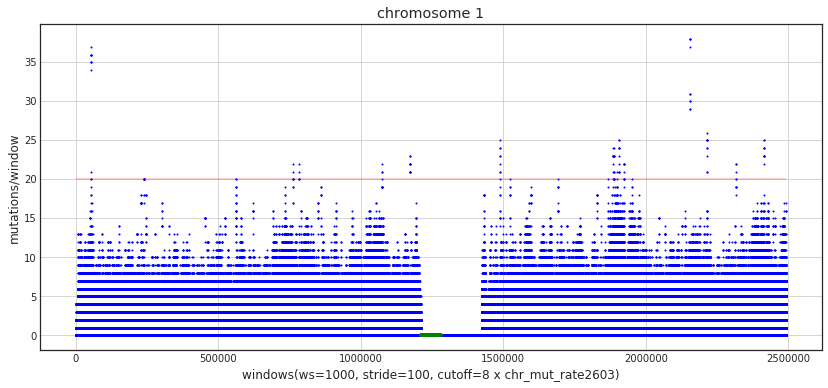

window idxs are: [['1' '5219300' '5221199']
 ['1' '76001200' '76002299']
 ['1' '78327200' '78328299']
 ['1' '107305700' '107306999']
 ['1' '117299400' '117301299']
 ['1' '148848400' '148850099']
 ['1' '188641300' '188642999']
 ['1' '188837800' '188839299']
 ['1' '189982300' '189983299']
 ['1' '190415800' '190417699']
 ['1' '192328200' '192329699']
 ['1' '215382400' '215384299']
 ['1' '221308800' '221310699']
 ['1' '231704900' '231706099']
 ['1' '241572100' '241573999']]
processing chromosome: 10
CPU times: user 12.4 s, sys: 6.96 s, total: 19.3 s
Wall time: 14.7 s
plotting sliding window result for chromosome 10


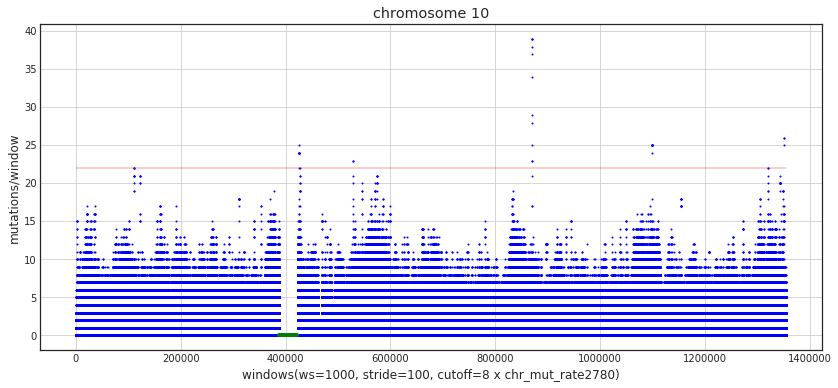

window idxs are: [['10' '42641100' '42642799']
 ['10' '52818600' '52819699']
 ['10' '87122100' '87124099']
 ['10' '109846400' '109848199']
 ['10' '135033400' '135034599']]
processing chromosome: 11
CPU times: user 13.1 s, sys: 8.05 s, total: 21.1 s
Wall time: 16.6 s
plotting sliding window result for chromosome 11


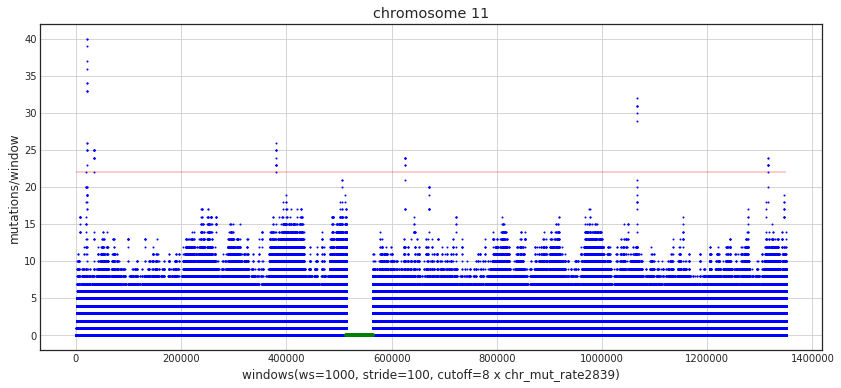

window idxs are: [['11' '2020700' '2022599']
 ['11' '2023000' '2024499']
 ['11' '3417600' '3419399']
 ['11' '38053300' '38055099']
 ['11' '62608400' '62609899']
 ['11' '106579900' '106581399']
 ['11' '131549600' '131551099']]
processing chromosome: 12
CPU times: user 11 s, sys: 5.81 s, total: 16.8 s
Wall time: 13 s
plotting sliding window result for chromosome 12


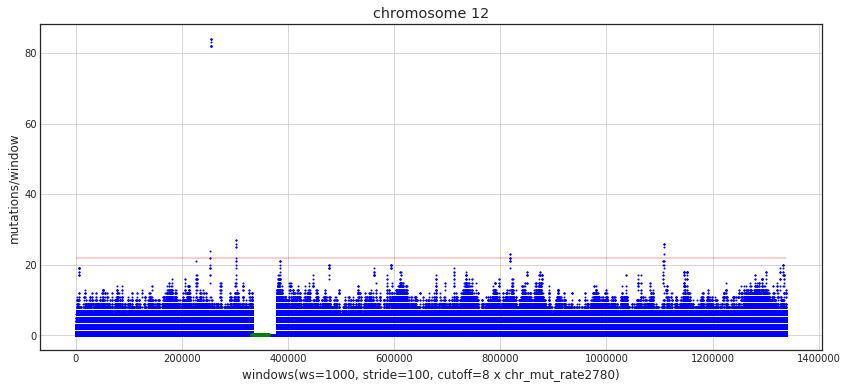

window idxs are: [['12' '25326600' '25327599']
 ['12' '25397300' '25399199']
 ['12' '30116800' '30118199']
 ['12' '81832700' '81833899']
 ['12' '110878000' '110879399']]
processing chromosome: 13
CPU times: user 10 s, sys: 4.55 s, total: 14.6 s
Wall time: 10.8 s
plotting sliding window result for chromosome 13


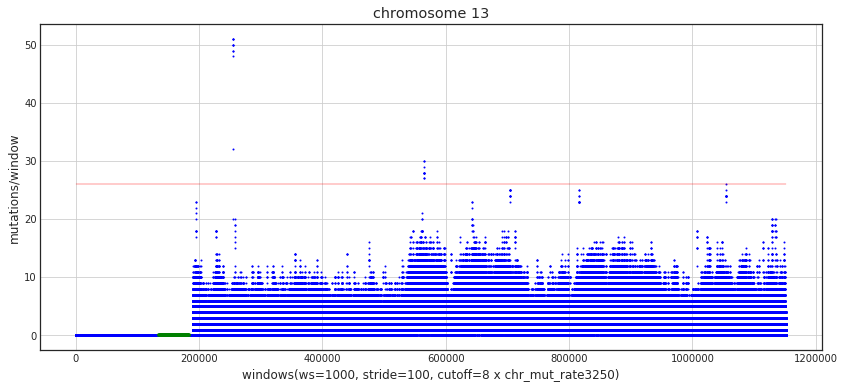

window idxs are: [['13' '25455100' '25456999']
 ['13' '56494800' '56496699']]
processing chromosome: 14
CPU times: user 8.92 s, sys: 4.32 s, total: 13.2 s
Wall time: 10.2 s
plotting sliding window result for chromosome 14


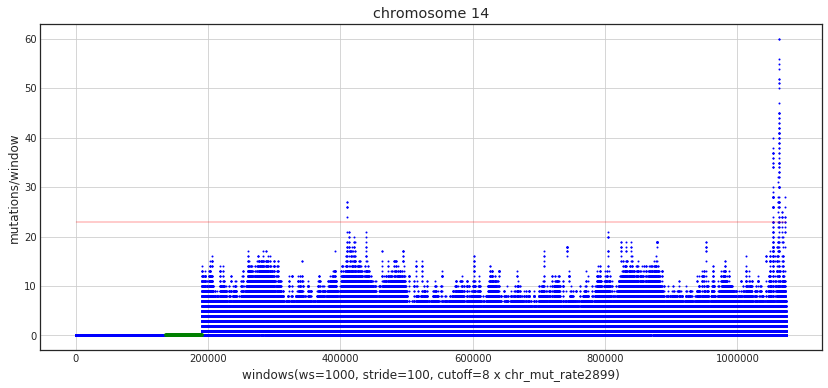

window idxs are: [['14' '41061900' '41063399']
 ['14' '105408500' '105412199']
 ['14' '105413200' '105414599']
 ['14' '106211800' '106214199']
 ['14' '106239200' '106241199']
 ['14' '106325700' '106331199']
 ['14' '106724700' '106726199']
 ['14' '107178300' '107179599']]
processing chromosome: 15
CPU times: user 10.1 s, sys: 6.31 s, total: 16.4 s
Wall time: 12.7 s
plotting sliding window result for chromosome 15


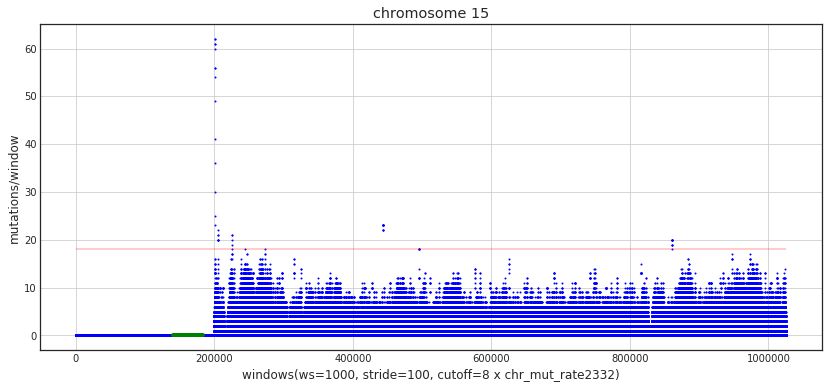

window idxs are: [['15' '20107300' '20109599']
 ['15' '20514600' '20516199']
 ['15' '22545700' '22546999']
 ['15' '44407500' '44409399']
 ['15' '86081400' '86083199']]
processing chromosome: 16
CPU times: user 8.21 s, sys: 4.83 s, total: 13 s
Wall time: 10 s
plotting sliding window result for chromosome 16


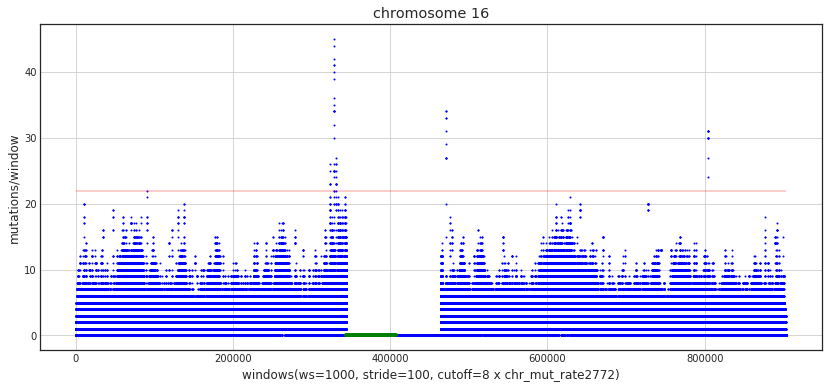

window idxs are: [['16' '32343300' '32344299']
 ['16' '32345300' '32346599']
 ['16' '32816400' '32819799']
 ['16' '33074300' '33076699']
 ['16' '47112100' '47113899']
 ['16' '80444000' '80445899']]
processing chromosome: 17
CPU times: user 7.6 s, sys: 5.9 s, total: 13.5 s
Wall time: 10.7 s
plotting sliding window result for chromosome 17


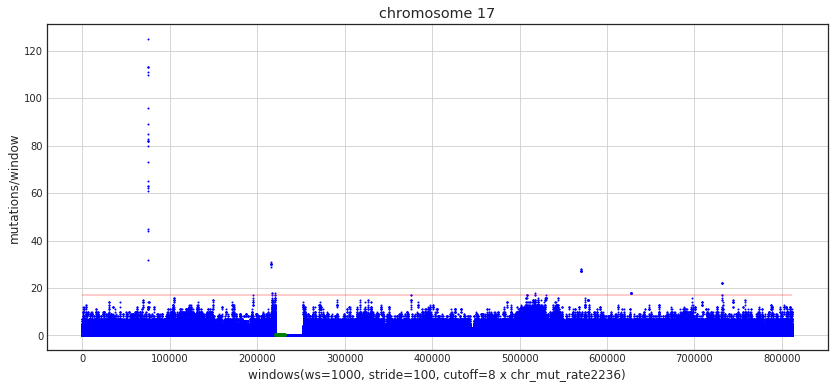

window idxs are: [['17' '7576100' '7579399']
 ['17' '21541500' '21543399']
 ['17' '21730600' '21731699']
 ['17' '22078900' '22079899']
 ['17' '51716400' '51717399']
 ['17' '57043900' '57045799']
 ['17' '62737000' '62738899']
 ['17' '73152000' '73153399']]
processing chromosome: 18
CPU times: user 6.41 s, sys: 3.31 s, total: 9.72 s
Wall time: 7.47 s
plotting sliding window result for chromosome 18


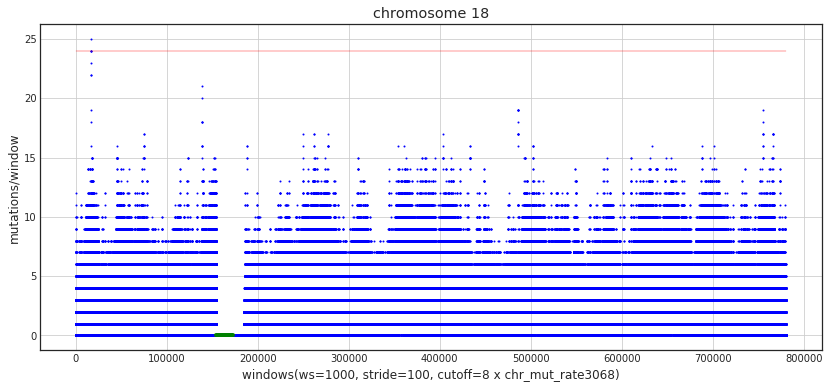

window idxs are: [['18' '1628900' '1629899']]
processing chromosome: 19
CPU times: user 5.2 s, sys: 2.33 s, total: 7.53 s
Wall time: 5.66 s
plotting sliding window result for chromosome 19


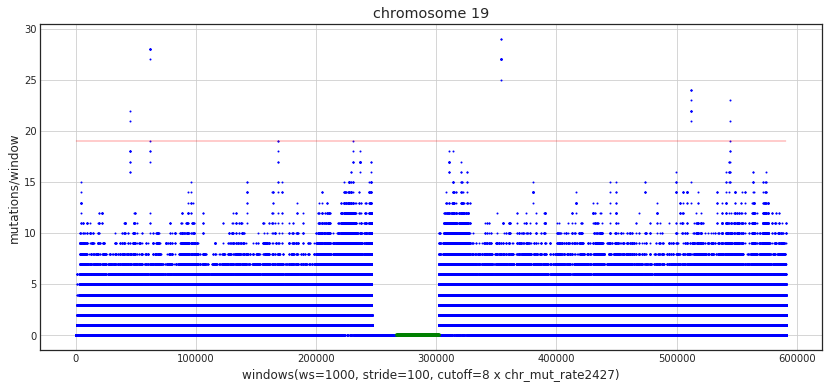

window idxs are: [['19' '4511200' '4512299']
 ['19' '6196200' '6197699']
 ['19' '35382600' '35384499']
 ['19' '51239900' '51241699']
 ['19' '54473000' '54474099']]
processing chromosome: 2
CPU times: user 20.1 s, sys: 11 s, total: 31.2 s
Wall time: 24.3 s
plotting sliding window result for chromosome 2


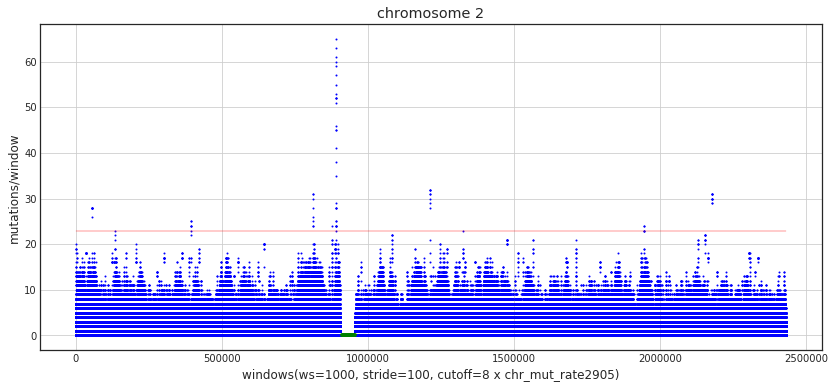

window idxs are: [['2' '5686100' '5687699']
 ['2' '39371400' '39372799']
 ['2' '81158200' '81159899']
 ['2' '87591400' '87592399']
 ['2' '88928000' '88929299']
 ['2' '89158400' '89161699']
 ['2' '121148300' '121149999']
 ['2' '194560300' '194561399']
 ['2' '217990700' '217992599']]
processing chromosome: 20
CPU times: user 5.09 s, sys: 2.31 s, total: 7.39 s
Wall time: 5.58 s
plotting sliding window result for chromosome 20


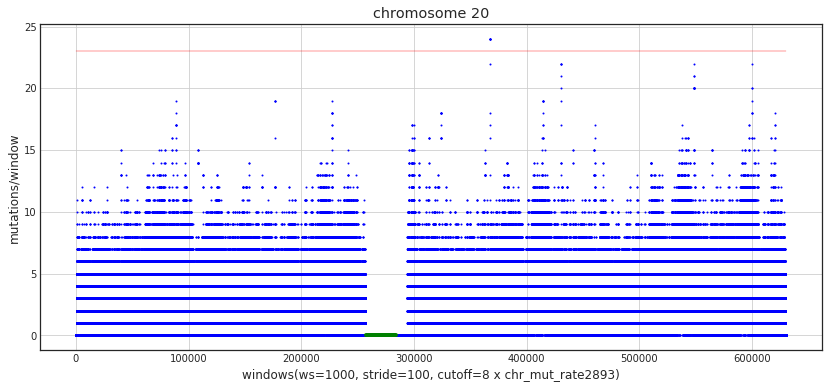

window idxs are: [['20' '36751600' '36752999']]
processing chromosome: 21
CPU times: user 3.93 s, sys: 1.86 s, total: 5.79 s
Wall time: 4.42 s
plotting sliding window result for chromosome 21


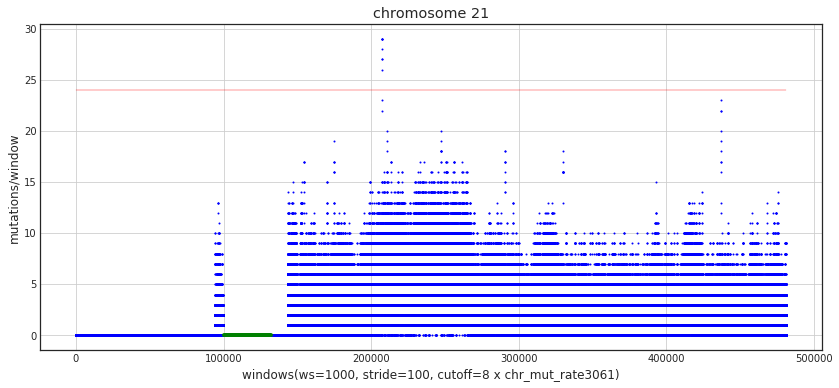

window idxs are: [['21' '20717300' '20718999']]
processing chromosome: 22
CPU times: user 4.17 s, sys: 2.06 s, total: 6.23 s
Wall time: 4.76 s
plotting sliding window result for chromosome 22


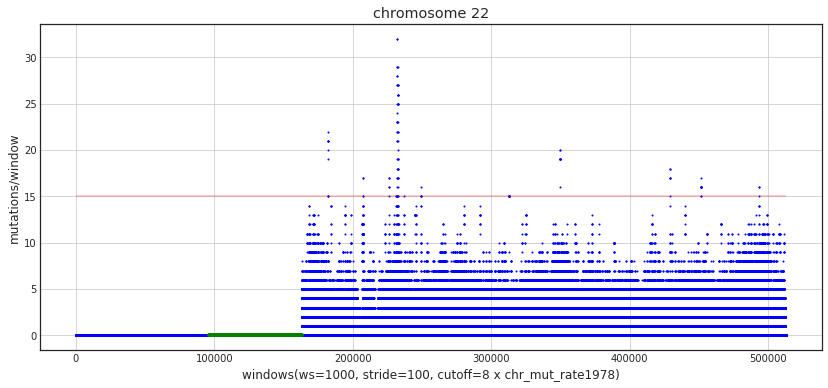

window idxs are: [['22' '18230200' '18231799']
 ['22' '20712300' '20713399']
 ['22' '22640900' '22642199']
 ['22' '23192300' '23193299']
 ['22' '23197400' '23199299']
 ['22' '23222500' '23224499']
 ['22' '23229800' '23232499']
 ['22' '23241700' '23243699']
 ['22' '24941600' '24942599']
 ['22' '34973500' '34975399']
 ['22' '42928800' '42930199']
 ['22' '45166700' '45168399']
 ['22' '49355000' '49356099']]
processing chromosome: 3
CPU times: user 16.5 s, sys: 7.56 s, total: 24.1 s
Wall time: 18.7 s
plotting sliding window result for chromosome 3


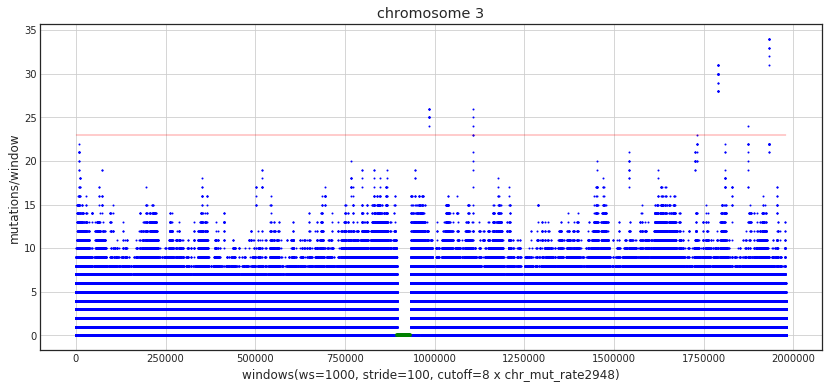

window idxs are: [['3' '98407200' '98409099']
 ['3' '110603100' '110604299']
 ['3' '178935100' '178936999']
 ['3' '178951100' '178952999']
 ['3' '187462300' '187463299']
 ['3' '193157900' '193159799']]
processing chromosome: 4
CPU times: user 17.7 s, sys: 7.73 s, total: 25.4 s
Wall time: 18.7 s
plotting sliding window result for chromosome 4


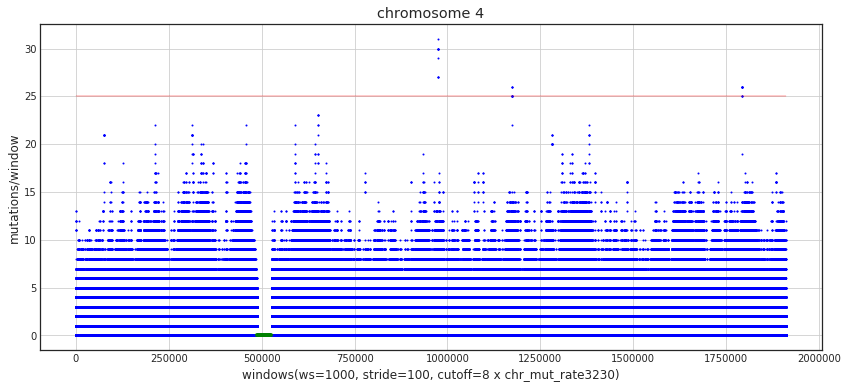

window idxs are: [['4' '97509500' '97511399']
 ['4' '117346900' '117348099']
 ['4' '179150100' '179151899']]
processing chromosome: 5
CPU times: user 17 s, sys: 14 s, total: 31 s
Wall time: 24.9 s
plotting sliding window result for chromosome 5


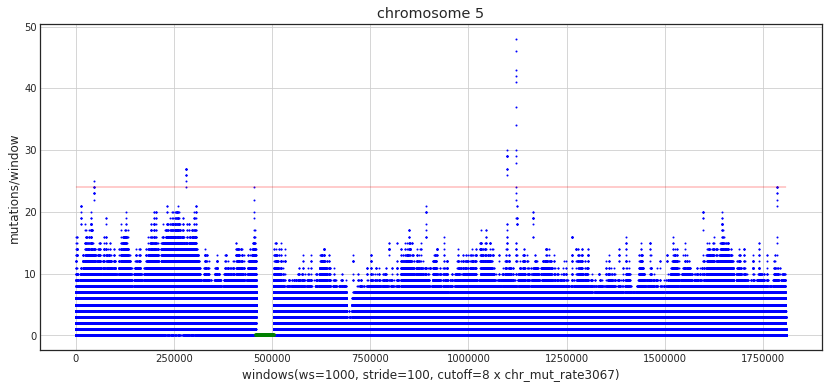

window idxs are: [['5' '4578500' '4579499']
 ['5' '28057000' '28058799']
 ['5' '109854800' '109856699']
 ['5' '112174500' '112176399']]
processing chromosome: 6
CPU times: user 16.2 s, sys: 9.92 s, total: 26.2 s
Wall time: 20.1 s
plotting sliding window result for chromosome 6


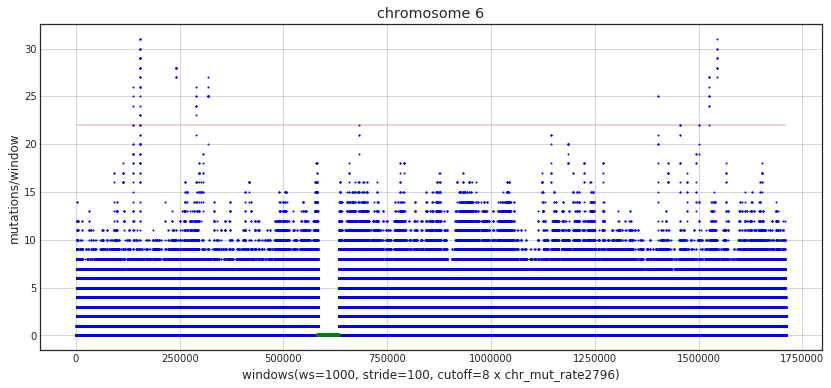

window idxs are: [['6' '13796100' '13797299']
 ['6' '15344600' '15348999']
 ['6' '24178600' '24180499']
 ['6' '28939800' '28941399']
 ['6' '31890900' '31892699']
 ['6' '140345100' '140346199']
 ['6' '152419100' '152420899']
 ['6' '154421100' '154422999']]
processing chromosome: 7
CPU times: user 15 s, sys: 12.5 s, total: 27.5 s
Wall time: 22.1 s
plotting sliding window result for chromosome 7


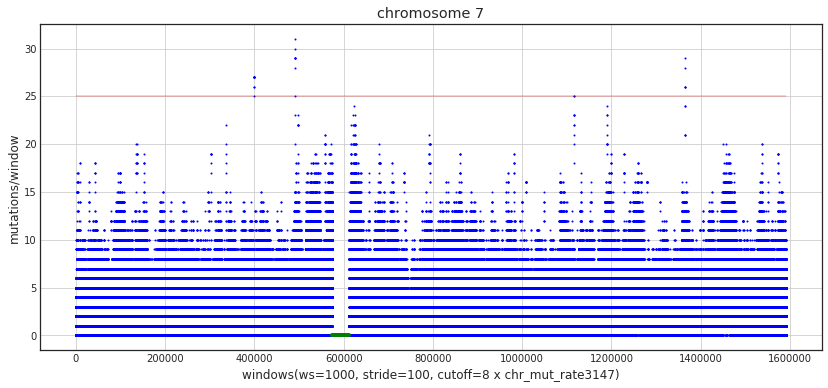

window idxs are: [['7' '39831900' '39833799']
 ['7' '49100000' '49101599']
 ['7' '136509800' '136511199']]
processing chromosome: 8
CPU times: user 13.7 s, sys: 10.1 s, total: 23.8 s
Wall time: 18.9 s
plotting sliding window result for chromosome 8


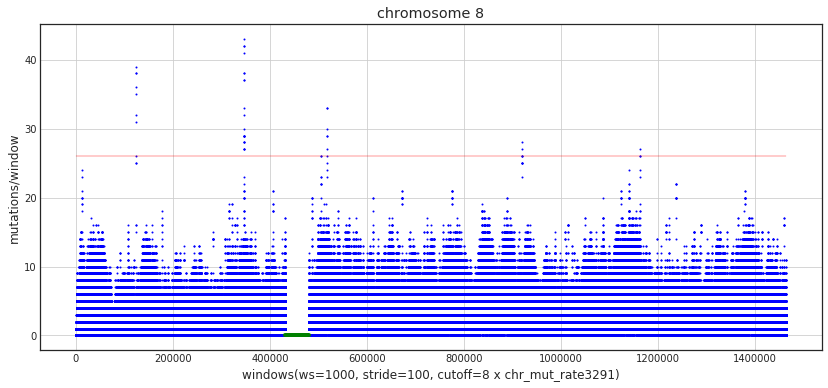

window idxs are: [['8' '12417200' '12418799']
 ['8' '34645100' '34647199']
 ['8' '34688200' '34690099']
 ['8' '51750100' '51751599']
 ['8' '91891000' '91892099']
 ['8' '116184100' '116185099']]
processing chromosome: 9
CPU times: user 12.7 s, sys: 6.05 s, total: 18.8 s
Wall time: 14.1 s
plotting sliding window result for chromosome 9


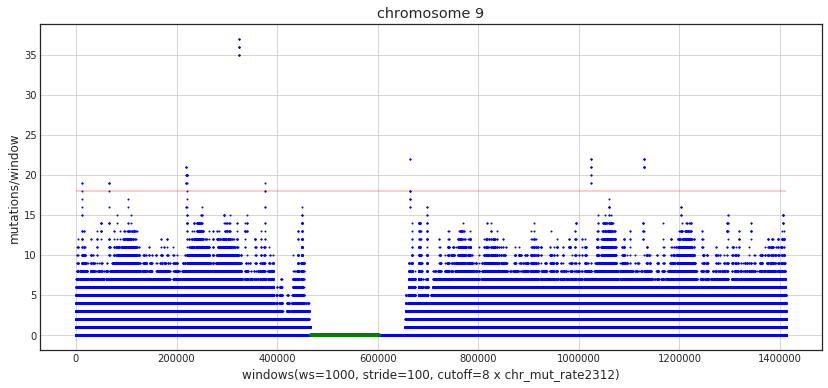

window idxs are: [['9' '1108500' '1109599']
 ['9' '6607800' '6608999']
 ['9' '21970300' '21971999']
 ['9' '22122900' '22124399']
 ['9' '32359300' '32361199']
 ['9' '37616400' '37617399']
 ['9' '66501900' '66502999']
 ['9' '102402900' '102404799']
 ['9' '112858900' '112860699']]
processing chromosome: 23
CPU times: user 14.6 s, sys: 10.6 s, total: 25.2 s
Wall time: 20 s
plotting sliding window result for chromosome 23


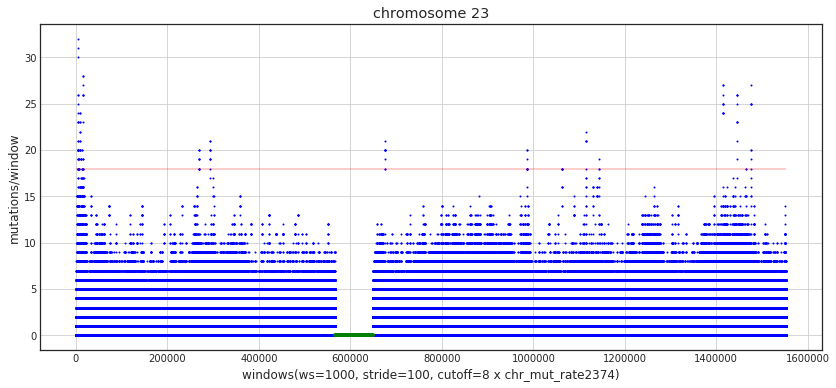

window idxs are: [['23' '359800' '361199']
 ['23' '390300' '391299']
 ['23' '434500' '436999']
 ['23' '503400' '504599']
 ['23' '600400' '601499']
 ['23' '829400' '830999']
 ['23' '881700' '883099']
 ['23' '1027100' '1028399']
 ['23' '1214200' '1215299']
 ['23' '1631500' '1633299']
 ['23' '26986700' '26988499']
 ['23' '29346000' '29347699']
 ['23' '67547500' '67549099']
 ['23' '98716200' '98717399']
 ['23' '111492700' '111493999']
 ['23' '114425700' '114426699']
 ['23' '141376800' '141378699']
 ['23' '144575400' '144577199']
 ['23' '147661900' '147663499']]
processing chromosome: 24
CPU times: user 8.72 s, sys: 2.94 s, total: 11.7 s
Wall time: 6.1 s
plotting sliding window result for chromosome 24


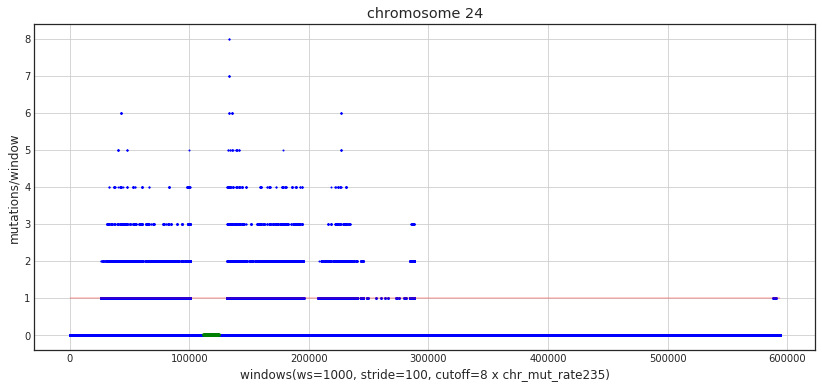

window idxs are: [['24' '2652500' '2653599']
 ['24' '2769500' '2771399']
 ['24' '2772000' '2773299']
 ...
 ['24' '28770700' '28772599']
 ['24' '28783700' '28785599']
 ['24' '28808600' '28812399']]


In [41]:
hotspots = pd.DataFrame()
for chrm in chromosomes: #['2', '3']:
    print('processing chromosome:', chrm)
    chrm_len = chr_sizes.loc[chrm, 'size']
    chr_variants = variants.query('chrom == "{}"'.format(chrm))
    zero_arr = np.zeros(chrm_len)
    chr_mut_rate = chr_mut_rates.loc[chrm, 'chr_mut_rate']
    window_mut_rate = wsize * chr_mut_rate/1e6
    # count numbe of mutation at each position and sort position
    vc_arr = chr_variants.pos.value_counts().sort_index()
    zero_arr[vc_arr.index.values] = vc_arr.values
    %time wsums, widxs = windowsum(zero_arr, wsize, stride, chr_mut_rate, chrm, mfold)
    plot_sliding_window_results(wsums, chrm, window_mut_rate, centromeres, chrm_len, chr_mut_rate)
    
    print('window idxs are:', widxs)
    hotspot = pd.DataFrame(data=widxs)
    if hotspot.empty:
        print('there is no windows with variants above the threshold on chr {}).'.format(chrm))
        continue
    hotspot[3] = hotspot[2].apply(int) - hotspot[1].apply(int) + 1
    hotspot[4] = chr_mut_rate
    if hotspots.empty:
        hotspots = hotspot
    else:
        hotspots = pd.concat([hotspots, hotspot], axis=0)

# annotate hotspots: count the number of mutations, patients, and annoatation in each identified hotspot

In [42]:
variants.chrom.unique()

array(['1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19',
       '2', '20', '21', '22', '3', '4', '5', '6', '7', '8', '9', '23',
       '24'], dtype=object)

In [43]:
def annotate_hotspots(hotspots, variants): # hotspots, variants are dfs
    '''count variants in each hotspots'''
    hotspot_annotations = []    
    for ix, row in hotspots.iterrows():        
        chr, start, end, length, chr_mut_rate = row.astype(int)
        print(ix, chr, start, end, length, chr_mut_rate)
        qdf = variants.query('chrom == "{}"'.format(chr))
        qdf = qdf[(qdf.pos >= start) & (qdf.pos <= end)]
        variant_count = qdf.pos.count()
        patient_count = qdf.pog_id.nunique()
        patient = ','.join(qdf.pog_id.unique())
#         if patient_count <= 3:
#             patient = ','.join(qdf.pog_id.unique())
#         else:
#             patient = 'multiple_patients'
        gene = ','.join(qdf.gene_id.unique().astype(str))
        effect = ','.join(qdf.effect.unique().astype(str))
        hotspot_mut_rate = '{0:.2f}'.format(variant_count/length * 1e6)
        hotspot_annotations.append([chr, start, end, length, chr_mut_rate, 
                                    variant_count, hotspot_mut_rate, 
                                    patient_count, gene, effect, patient])
    hs_anns = pd.DataFrame(hotspot_annotations)
    hs_anns.columns = ['chr', 'start', 'end', 'length', 'chr_mut_rate_Mb', 'variant_count', 
                   'hotspot_mut_rate_Mb', 'patient_count', 'genes_affected', 'effects', 'patients']
    return hs_anns

In [178]:
def variants_in_hotspots_depreciated(hotspots, variants): # hotspots, variants are dfs
    '''count variants in each hotspots'''
    variant_counts = []
    for ix, row in hotspots.iterrows():        
        chr, start, end, length, chr_mut_rate = row.astype(int)
#         print(ix, chr, start, end, length, chr_mut_rate)
        qdf = variants.query('chrom == "{}"'.format(chr))
        arr = qdf.pos.astype(int)
        variant_count = ((arr >= start) & (arr <= end)).sum()
#         hotspot_mut_rate = int(variant_count/length * 1e6)
        hotspot_mut_rate = '{0:.2f}'.format(variant_count/length * 1e6)
#         print('number of variants: {0}, {1}'.format(variant_count, hotspot_mut_rate))
        variant_counts.append([chr, start, end, length, chr_mut_rate, variant_count, hotspot_mut_rate])
    vcs = pd.DataFrame(variant_counts)
    vcs.columns = ['chr', 'start', 'end', 'length', 'chr_mut_rate_Mb', 'variant_count', 'hotspot_mut_rate_Mb']
    return vcs

In [44]:
variants['gene_id'] = variants.gene_id.fillna('intergenic')

In [45]:
hs_anns = annotate_hotspots(hotspots, variants)

0 1 5219300 5221199 1900 2603
1 1 76001200 76002299 1100 2603
2 1 78327200 78328299 1100 2603
3 1 107305700 107306999 1300 2603
4 1 117299400 117301299 1900 2603
5 1 148848400 148850099 1700 2603
6 1 188641300 188642999 1700 2603
7 1 188837800 188839299 1500 2603
8 1 189982300 189983299 1000 2603
9 1 190415800 190417699 1900 2603
10 1 192328200 192329699 1500 2603
11 1 215382400 215384299 1900 2603
12 1 221308800 221310699 1900 2603
13 1 231704900 231706099 1200 2603
14 1 241572100 241573999 1900 2603
0 10 42641100 42642799 1700 2780
1 10 52818600 52819699 1100 2780
2 10 87122100 87124099 2000 2780
3 10 109846400 109848199 1800 2780
4 10 135033400 135034599 1200 2780
0 11 2020700 2022599 1900 2839
1 11 2023000 2024499 1500 2839
2 11 3417600 3419399 1800 2839
3 11 38053300 38055099 1800 2839
4 11 62608400 62609899 1500 2839
5 11 106579900 106581399 1500 2839
6 11 131549600 131551099 1500 2839
0 12 25326600 25327599 1000 2780
1 12 25397300 25399199 1900 2780
2 12 30116800 30118199 1400 2

108 24 4424800 4426599 1800 235
109 24 4427500 4431199 3700 235
110 24 4446100 4447799 1700 235
111 24 4448500 4449899 1400 235
112 24 4450800 4451999 1200 235
113 24 4453400 4455099 1700 235
114 24 4469400 4471899 2500 235
115 24 4475700 4477499 1800 235
116 24 4479900 4481799 1900 235
117 24 4503500 4505999 2500 235
118 24 4509200 4511799 2600 235
119 24 4521600 4524299 2700 235
120 24 4528100 4529999 1900 235
121 24 4533200 4534999 1800 235
122 24 4565800 4567699 1900 235
123 24 4579100 4580599 1500 235
124 24 4580800 4581999 1200 235
125 24 4586300 4589199 2900 235
126 24 4590000 4591799 1800 235
127 24 4598800 4601899 3100 235
128 24 4615800 4616899 1100 235
129 24 4622900 4624799 1900 235
130 24 4631200 4632499 1300 235
131 24 4657800 4659099 1300 235
132 24 4681400 4683399 2000 235
133 24 4691400 4692999 1600 235
134 24 4702900 4704699 1800 235
135 24 4708600 4710499 1900 235
136 24 4713300 4715199 1900 235
137 24 4748400 4750299 1900 235
138 24 4753400 4754399 1000 235
139 24 4

366 24 8857300 8858499 1200 235
367 24 8876100 8877699 1600 235
368 24 8981700 8983599 1900 235
369 24 8999400 9001899 2500 235
370 24 9015800 9017699 1900 235
371 24 9033100 9034699 1600 235
372 24 9064300 9065399 1100 235
373 24 9083900 9085599 1700 235
374 24 9087600 9088799 1200 235
375 24 9107000 9108299 1300 235
376 24 9120600 9121799 1200 235
377 24 9147500 9148499 1000 235
378 24 9182700 9184599 1900 235
379 24 9381500 9383199 1700 235
380 24 9385100 9386999 1900 235
381 24 9400200 9401299 1100 235
382 24 9406200 9408099 1900 235
383 24 9415000 9416199 1200 235
384 24 9427700 9429599 1900 235
385 24 9432900 9434799 1900 235
386 24 9437600 9438899 1300 235
387 24 9444700 9446399 1700 235
388 24 9465800 9467599 1800 235
389 24 9642500 9644399 1900 235
390 24 9648000 9649599 1600 235
391 24 9762900 9764399 1500 235
392 24 9769800 9771599 1800 235
393 24 9806000 9807899 1900 235
394 24 9816800 9819099 2300 235
395 24 9854000 9854999 1000 235
396 24 9855800 9857599 1800 235
397 24 9

610 24 15766200 15768399 2200 235
611 24 15771200 15772299 1100 235
612 24 15773400 15775299 1900 235
613 24 15779700 15781499 1800 235
614 24 15789700 15790899 1200 235
615 24 15801100 15802399 1300 235
616 24 15813200 15814699 1500 235
617 24 15819600 15820899 1300 235
618 24 15876200 15878099 1900 235
619 24 15886100 15887999 1900 235
620 24 15891800 15892799 1000 235
621 24 15898200 15900099 1900 235
622 24 15920600 15923399 2800 235
623 24 15934100 15935999 1900 235
624 24 15938700 15940599 1900 235
625 24 15953500 15954699 1200 235
626 24 15961700 15963499 1800 235
627 24 15964300 15965399 1100 235
628 24 15983500 15985099 1600 235
629 24 15988600 15990899 2300 235
630 24 16005800 16008399 2600 235
631 24 16012800 16014199 1400 235
632 24 16015700 16017399 1700 235
633 24 16023100 16024899 1800 235
634 24 16038200 16040099 1900 235
635 24 16042300 16044299 2000 235
636 24 16046500 16048699 2200 235
637 24 16058400 16059599 1200 235
638 24 16066500 16068399 1900 235
639 24 1608970

852 24 19125400 19127299 1900 235
853 24 19145300 19146499 1200 235
854 24 19152100 19153499 1400 235
855 24 19154400 19157099 2700 235
856 24 19159500 19160899 1400 235
857 24 19188300 19189599 1300 235
858 24 19214300 19215299 1000 235
859 24 19220600 19222899 2300 235
860 24 19224100 19225899 1800 235
861 24 19227200 19229899 2700 235
862 24 19253200 19255099 1900 235
863 24 19276500 19279699 3200 235
864 24 19309400 19310799 1400 235
865 24 19313300 19314399 1100 235
866 24 19334100 19335399 1300 235
867 24 19354000 19357199 3200 235
868 24 19361500 19363299 1800 235
869 24 19397300 19399099 1800 235
870 24 19402100 19403299 1200 235
871 24 19415200 19417099 1900 235
872 24 19426100 19427999 1900 235
873 24 19438500 19439799 1300 235
874 24 19442900 19444799 1900 235
875 24 19461700 19464099 2400 235
876 24 19471600 19473299 1700 235
877 24 19495100 19496599 1500 235
878 24 19515100 19517699 2600 235
879 24 19539600 19541499 1900 235
880 24 20821200 20822199 1000 235
881 24 2105370

In [60]:
hs_anns.head()

,chr,start,end,length,chr_mut_rate_Mb,variant_count,hotspot_mut_rate_Mb,patient_count,genes_affected,effects,patients
0,1,5219300,5221199,1900,2603,39,20526.32,36,intergenic,intergenic_region,"POG608,POG777,POG927,POG111,POG885,POG577,POG6..."
1,1,76001200,76002299,1100,2603,22,20000.00,17,"U6,SLC44A5","downstream_gene_variant,intron_variant","POG304,POG097,POG021,POG092,POG498,POG684,POG1..."
2,1,78327200,78328299,1100,2603,22,20000.00,18,FAM73A,intron_variant,"POG927,POG637,POG707,POG724,POG748,POG929,POG9..."
3,1,107305700,107306999,1300,2603,23,17692.31,23,intergenic,intergenic_region,"POG068,POG795,POG386,POG687,POG147,POG455,POG1..."
4,1,117299400,117301299,1900,2603,23,12105.26,23,CD2,intron_variant,"POG415,POG003,POG884,POG354,POG487,POG073,POG1..."


In [47]:
mfold

8

In [49]:
# annotate protein coding or noncoding
f11 = '/projects/wtsspipeline/programs/external_programs/Automation/v2.0/resources/ExpressionAnalysis/ENSGID_Name_Status_Biotype_hg19_ens69.txt'
df11 = pd.read_csv(f11, sep='\t')
df11.head(2)

,ID,name,status,biotype
0,ENSG00000000003,TSPAN6,KNOWN,protein_coding
1,ENSG00000000005,TNMD,KNOWN,protein_coding


In [54]:
mapdict = pd.Series(df11.biotype.values, index=df11.name).to_dict()

In [71]:
(hs_anns.genes_affected).map(mapdict)[:2] # map a column based on a dictionary

0    NaN
1    NaN
Name: genes_affected, dtype: object

In [82]:
test = hs_anns.head()

In [84]:
test

,chr,start,end,length,chr_mut_rate_Mb,variant_count,hotspot_mut_rate_Mb,patient_count,genes_affected,effects,patients
0,1,5219300,5221199,1900,2603,39,20526.32,36,intergenic,intergenic_region,"POG608,POG777,POG927,POG111,POG885,POG577,POG6..."
1,1,76001200,76002299,1100,2603,22,20000.00,17,"U6,SLC44A5","downstream_gene_variant,intron_variant","POG304,POG097,POG021,POG092,POG498,POG684,POG1..."
2,1,78327200,78328299,1100,2603,22,20000.00,18,FAM73A,intron_variant,"POG927,POG637,POG707,POG724,POG748,POG929,POG9..."
3,1,107305700,107306999,1300,2603,23,17692.31,23,intergenic,intergenic_region,"POG068,POG795,POG386,POG687,POG147,POG455,POG1..."
4,1,117299400,117301299,1900,2603,23,12105.26,23,CD2,intron_variant,"POG415,POG003,POG884,POG354,POG487,POG073,POG1..."


In [104]:
mfold = 8
wkdir = '/projects/trans_scratch/validations/workspace/szong/NC_500/NC_POG500/'
f = '/projects/trans_scratch/validations/workspace/szong/NC_500/NC_POG500/hotspots_w1000_s100_f8.txt.annotated'
df = pd.read_csv(f)
df.head()

,chr,start,end,length,chr_mut_rate_Mb,variant_count,hotspot_mut_rate_Mb,patient_count,genes_affected,effects,patients
0,1,5219300,5221199,1900,2563,39,20526.32,36,intergenic,intergenic_region,"POG608,POG777,POG927,POG111,POG885,POG577,POG6..."
1,1,76001200,76002299,1100,2563,22,20000.00,17,"U6,SLC44A5","downstream_gene_variant,intron_variant","POG304,POG097,POG021,POG092,POG498,POG684,POG1..."
2,1,78327200,78328299,1100,2563,22,20000.00,18,FAM73A,intron_variant,"POG927,POG637,POG707,POG724,POG748,POG929,POG9..."
3,1,107305700,107306999,1300,2563,23,17692.31,23,intergenic,intergenic_region,"POG068,POG795,POG386,POG687,POG147,POG455,POG1..."
4,1,117299400,117301299,1900,2563,23,12105.26,23,CD2,intron_variant,"POG415,POG003,POG884,POG354,POG487,POG073,POG1..."


In [105]:
for idx,row in df.iterrows():
    genes = row.genes_affected.split(',')
    biotypes = ','.join([mapdict[i] if i in mapdict else i for i in genes ])
    df.loc[idx, 'biotypes'] = biotypes


# of = '/projects/trans_scratch/validations/workspace/szong/NC_500/hotspots.txt'
of = '{0}hotspots_w{1}_s{2}_f{3}.txt.annotated.txt'.format(wkdir, wsize, stride, mfold) 
df.to_csv(of, index=False)

# look at tert promoter mutations as sanity check

In [76]:
tert_file = '{}tert_mutations.txt'.format(wkdir)
terts = pd.read_csv(tert_file, sep='\t', header=None)
terts.shape

(159, 17)

In [77]:
terts.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,5,1248732,G,A,20;0.89,0.069307,94,7,101,P01948,POG714,TERT,ENST00000310581,NaN,downstream_gene_variant,MODIFIER,Primary
1,5,1249047,C,T,35;1,0.275862,42,16,58,P01825,POG637,TERT,ENST00000310581,NaN,downstream_gene_variant,MODIFIER,Metastatic


In [185]:
terts[1].value_counts().sort_index().head()

1248732    1
1249047    1
1249639    1
1250311    1
1252817    1
Name: 1, dtype: int64

# intermutational distance analysis

In [451]:
tdf = df1.copy()

In [470]:
# count_threshold = 15
count_threshold = int(tdf.library_name.nunique() * 0.1)
if count_threshold < 10:
    count_threshold = 10
distance_threshold = 0.2
# fold_change = 5

In [471]:
count_threshold

14

In [472]:
tdf['snv1'] = tdf['ref'] + ">" + tdf['alt']
# tdf['snv'] = tdf.loc[:,['ref', 'alt']].apply(lambda x: '>'.join(x), axis=1)
tdf.head()

,chrom,pos,ref,alt,qual,af_tumour,tumour_ref_count,tumour_alt_count,tumour_total_count,library_name,pog_id,gene_id,transcript_id,aa_change,effect,impact,cancer_stage,snv1,snv2
7,1,17534,G,C,39;0.98,0.298246,40,17,57,P00112,POG074,DDX11L1,ENST00000450305,NaN,downstream_gene_variant,MODIFIER,Metastatic,G>C,C>G
16,1,60850,C,T,43;0.91,0.349206,41,22,63,T00283,POG032,OR4G11P,ENST00000492842,NaN,upstream_gene_variant,MODIFIER,Metastatic,C>T,C>T
20,1,66085,C,G,25;0.93,0.581395,18,25,43,P02244,POG830,OR4F5,ENST00000335137,NaN,upstream_gene_variant,MODIFIER,Metastatic,C>G,C>G
21,1,66521,T,TATATA,33,0.025641,100,3,117,P00927,POG329,OR4F5,ENST00000335137,NaN,upstream_gene_variant,MODIFIER,Metastatic,T>TATATA,indel
23,1,73830,G,C,33;0.97,0.448276,16,13,29,P01739,POG661,OR4F5,ENST00000335137,NaN,downstream_gene_variant,MODIFIER,Metastatic,G>C,C>G


In [473]:
base_dicts = {'A': 'T', 'T':'A', 'C':'G', 'G':'C'}

In [474]:
def categorize_mutation(x):
#     print(x)
    if len(x) > 3:
        y = 'indel'
    elif x.startswith('G') or x.startswith('A'):
        y = ''.join(base_dicts.get(i, i) for i in x)
    else: y = x
#     print(y)
    return y

In [475]:
tdf['snv2'] = tdf['snv1'].apply(categorize_mutation)

In [476]:
of = '{}mutations_6_categories.txt'.format(wkdir)
# tdf.to_csv(of, sep='\t')

In [477]:
tdf.snv2.unique()

array(['C>G', 'C>T', 'indel', 'T>C', 'T>G', 'C>A', 'T>A'], dtype=object)

In [478]:
# colors = ['r.', 'g.', 'b.', 'c.', 'y.','k.','m.']
colors = ["purple", "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2","#D55E00","#CC79A7", "#E41A1C", "#377EB8"]

In [479]:
# df = df2.copy()
snv_pos = np.array([2, 5, 9, 12, 15, 19, 23, 33])
def locate_centromere(df, chrm, snv_pos):
    if chrm == 'X':
        chrm = '23'
    if chrm == 'Y':
        chrm = '24'
    dftmp = (df.query('chr == "{}"'.format(chrm))[['start', 'end']])
    cen_start = dftmp.min().min()
    cen_end = dftmp.max().max()
    print(cen_start, cen_end)
    lidx = np.abs(snv_pos - cen_start).argmin()
    hidx = np.abs(snv_pos - cen_end).argmin()
    
#     low = snv_pos[snv_pos <= cen_start].max()
#     lowidx = np.where(snv_pos==low)
#     high = snv_pos[snv_pos >= cen_end].min()
#     highidx = np.where(snv_pos==high)
    print(lidx,hidx)
    return (lidx, hidx)
    
assert locate_centromere(centromeres, 99, snv_pos) == (3,5)

12 18
3 5


99241 99241
121100000 128000000
46083 46083
xxxx 46083 46083
0
1
2
3
4
5
6


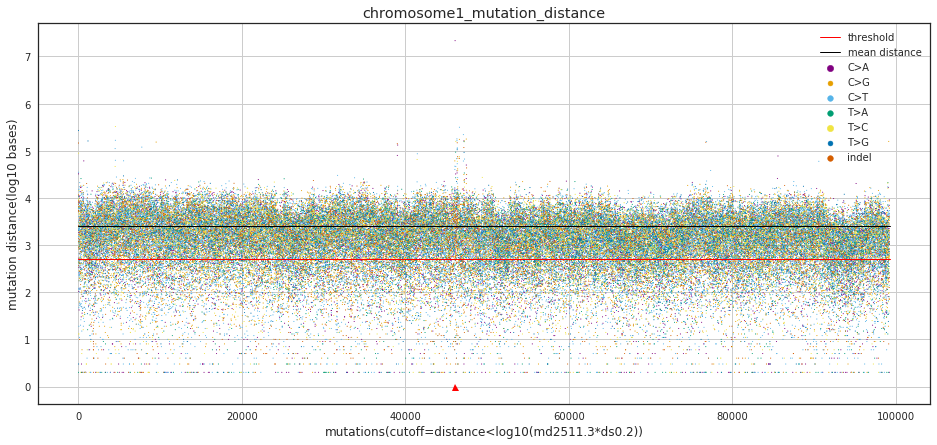

56894 56894
38800000 42100000
19008 19009
xxxx 19008 19009
0
1
2
3
4
5
6


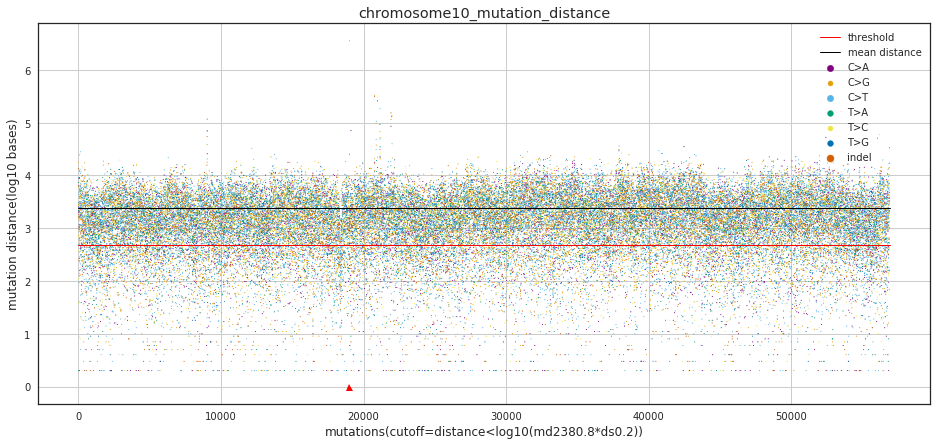

55703 55703
51400000 56400000
22417 22418
xxxx 22417 22418
0
1
2
3
4
5
6


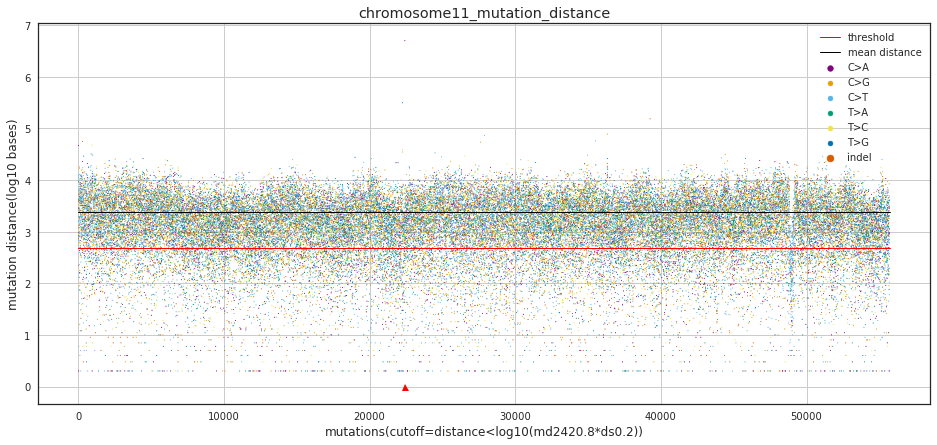

57281 57281
33200000 36500000
13742 13743
xxxx 13742 13743
0
1
2
3
4
5
6


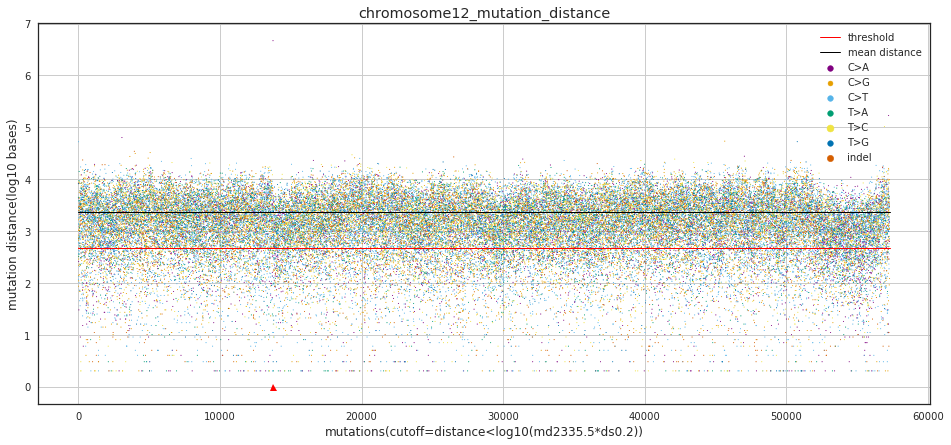

39875 39875
13500000 18400000
0 0
xxxx 0 0
0
1
2
3
4
5
6


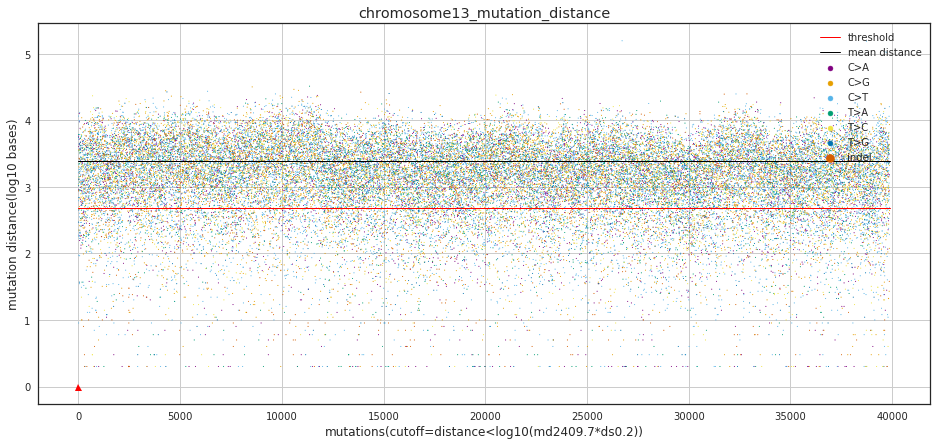

36550 36550
13600000 19100000
0 0
xxxx 0 0
0
1
2
3
4
5
6


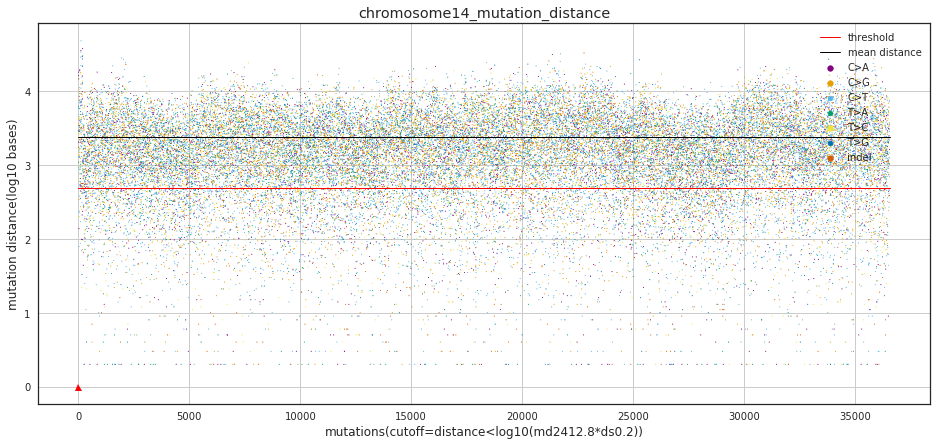

31196 31196
14100000 18400000
0 0
xxxx 0 0
0
1
2
3
4
5
6


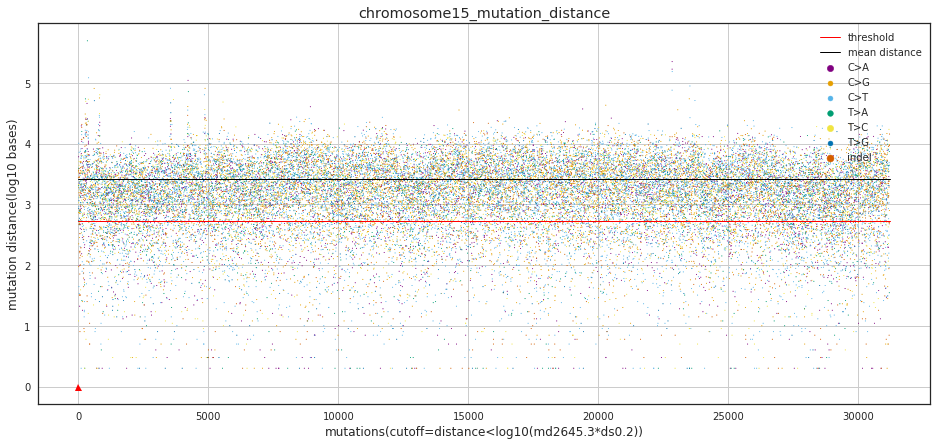

34409 34409
34400000 40700000
16116 16117
xxxx 16116 16117
0
1
2
3
4
5
6


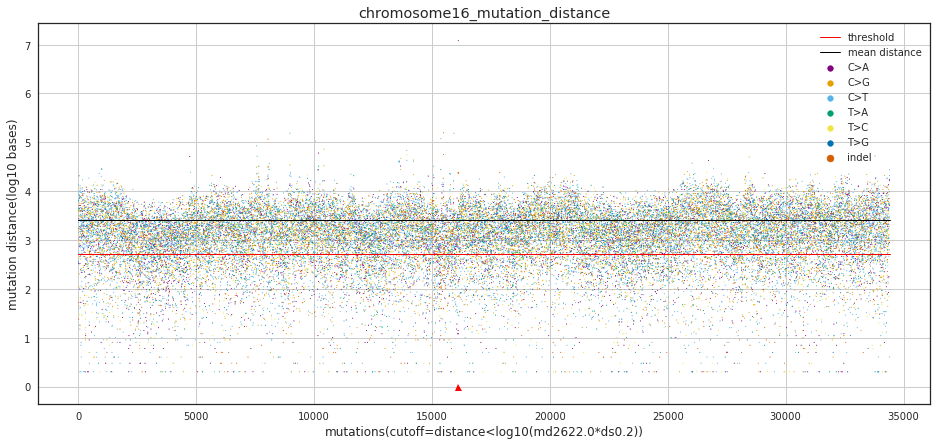

29424 29424
22100000 23200000
7129 7129
xxxx 7129 7129
0
1
2
3
4
5
6


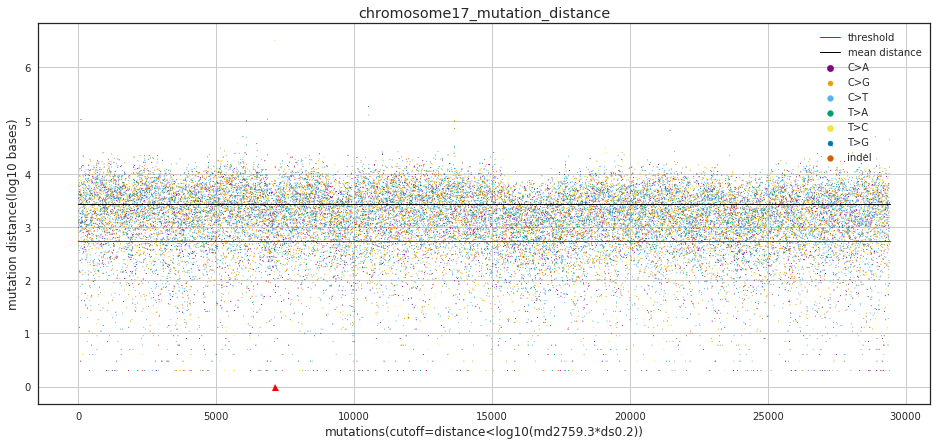

33073 33073
15400000 17300000
6984 6985
xxxx 6984 6985
0
1
2
3
4
5
6


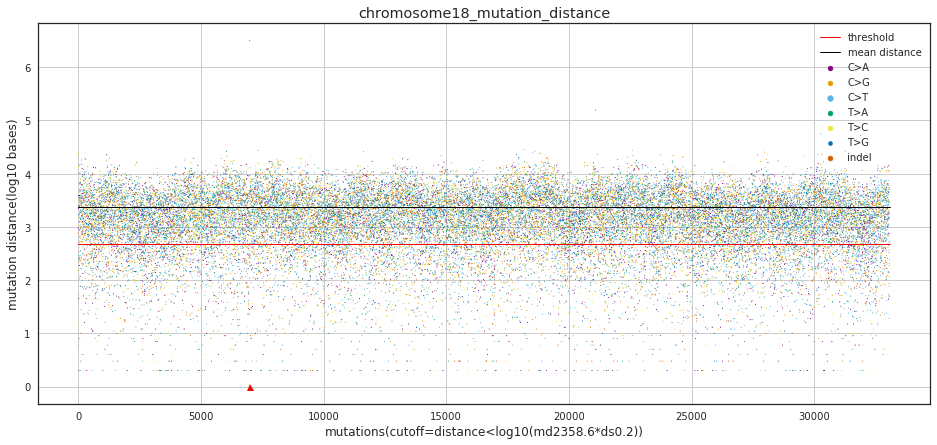

21474 21474
26700000 30200000
9418 9419
xxxx 9418 9419
0
1
2
3
4
5
6


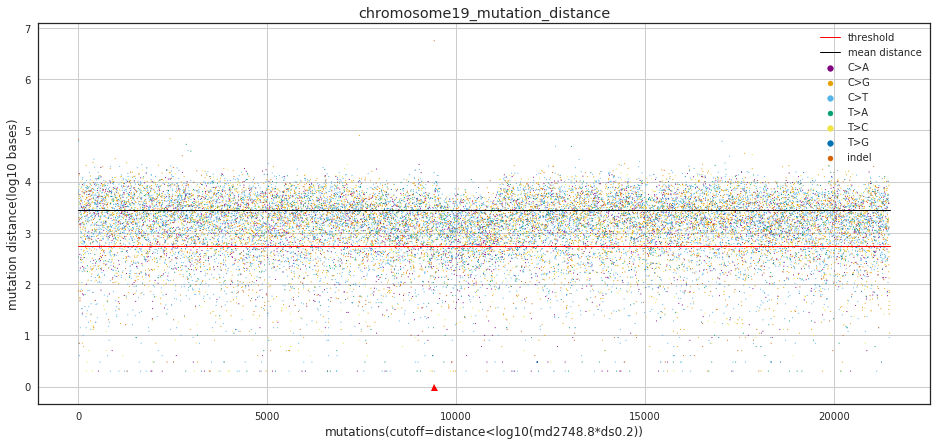

106758 106758
91000000 95700000
42249 42250
xxxx 42249 42250
0
1
2
3
4
5
6


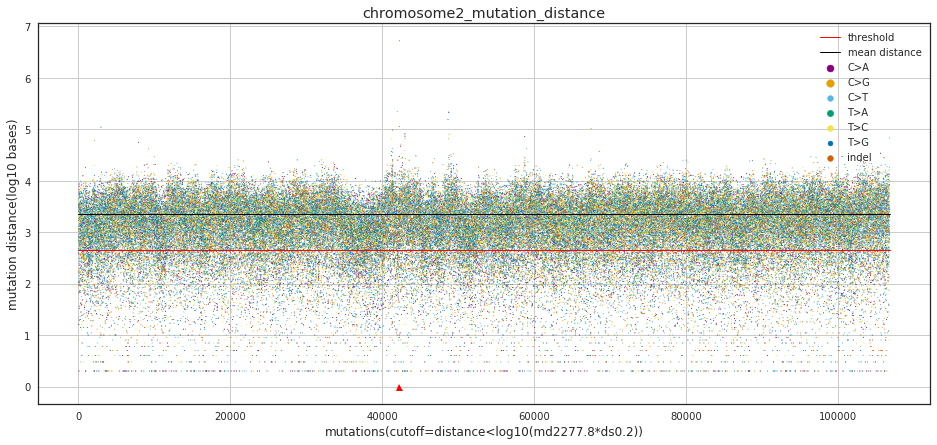

28787 28787
25700000 28400000
12037 12038
xxxx 12037 12038
0
1
2
3
4
5
6


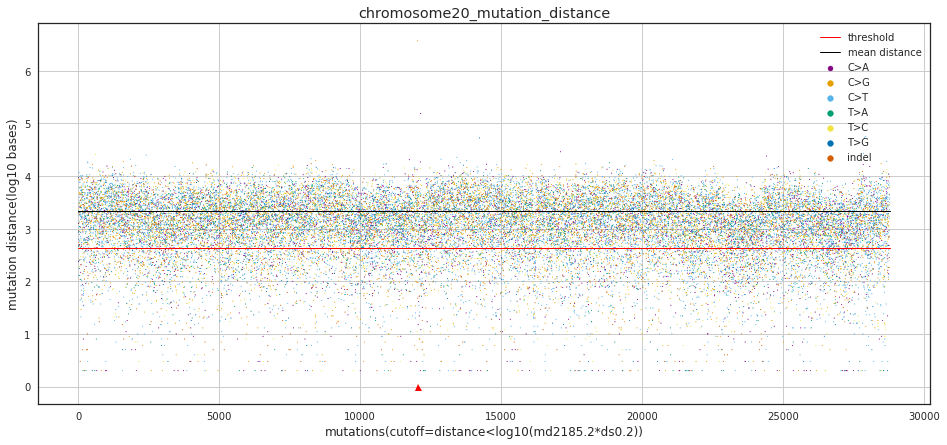

15088 15088
10000000 13200000
70 71
xxxx 70 71
0
1
2
3
4
5
6


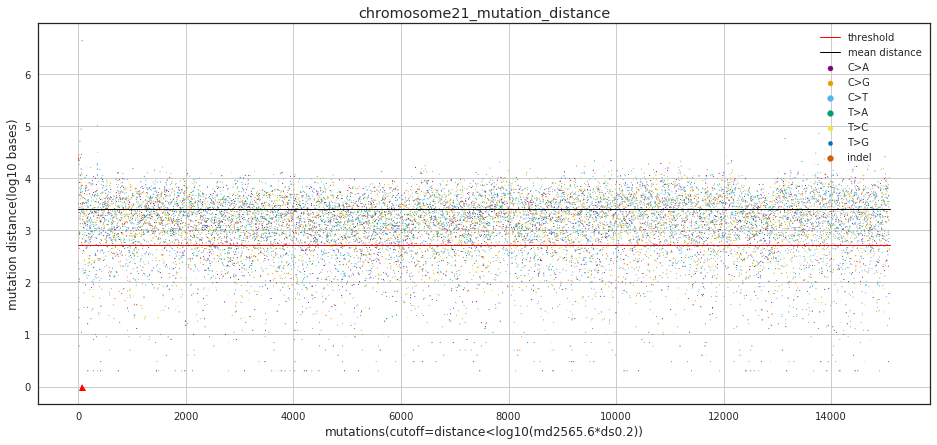

12015 12015
9600000 16300000
0 0
xxxx 0 0
0
1
2
3
4
5
6


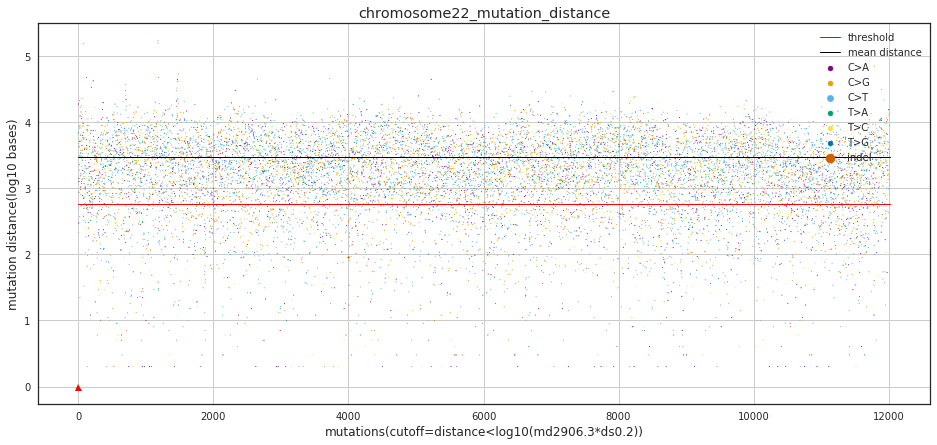

88756 88756
89400000 93200000
37361 37362
xxxx 37361 37362
0
1
2
3
4
5
6


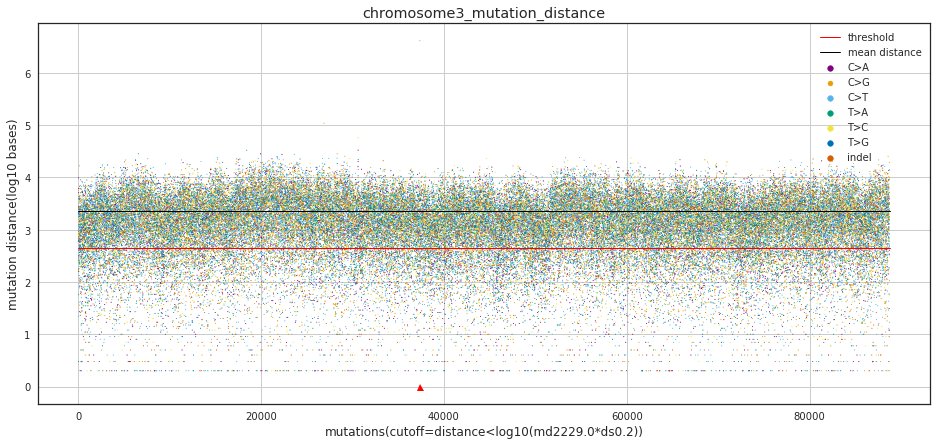

83001 83001
48700000 52400000
21568 21569
xxxx 21568 21569
0
1
2
3
4
5
6


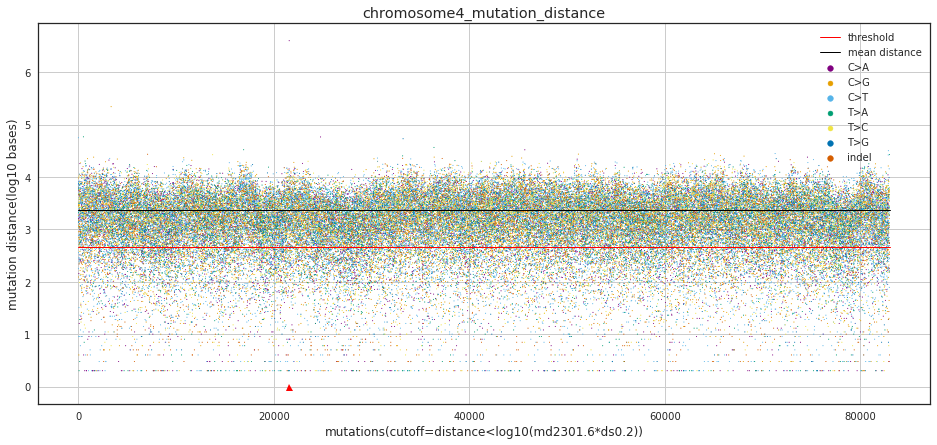

78280 78280
45800000 50500000
26316 26317
xxxx 26316 26317
0
1
2
3
4
5
6


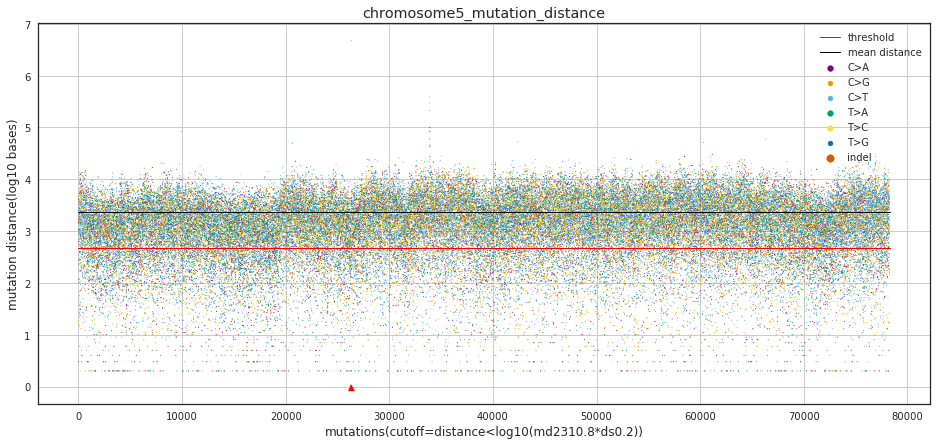

72297 72297
58400000 63400000
25184 25185
xxxx 25184 25185
0
1
2
3
4
5
6


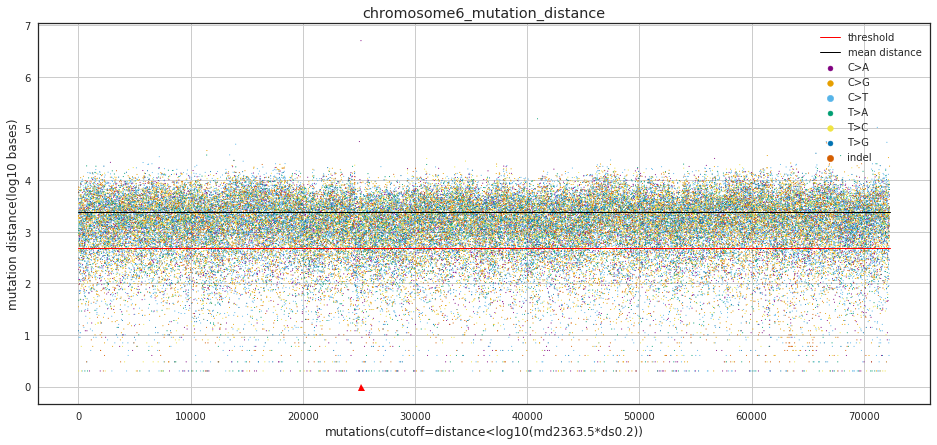

74289 74289
57400000 61100000
27971 27972
xxxx 27971 27972
0
1
2
3
4
5
6


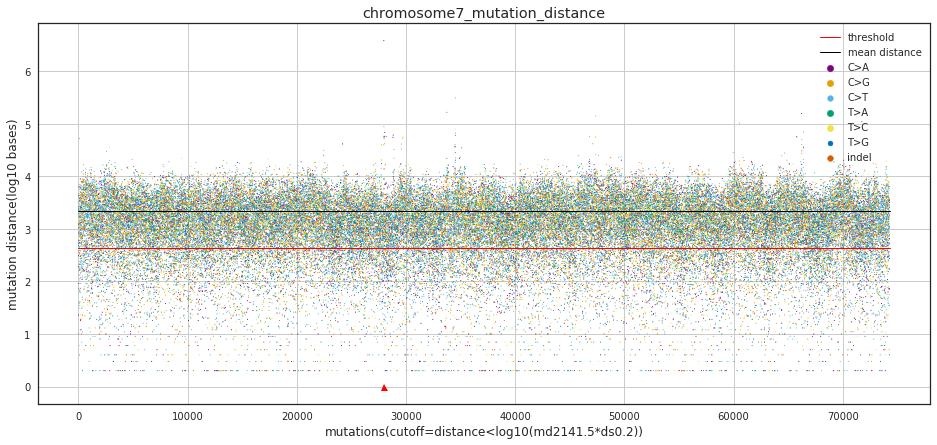

70979 70979
43200000 48100000
17328 17329
xxxx 17328 17329
0
1
2
3
4
5
6


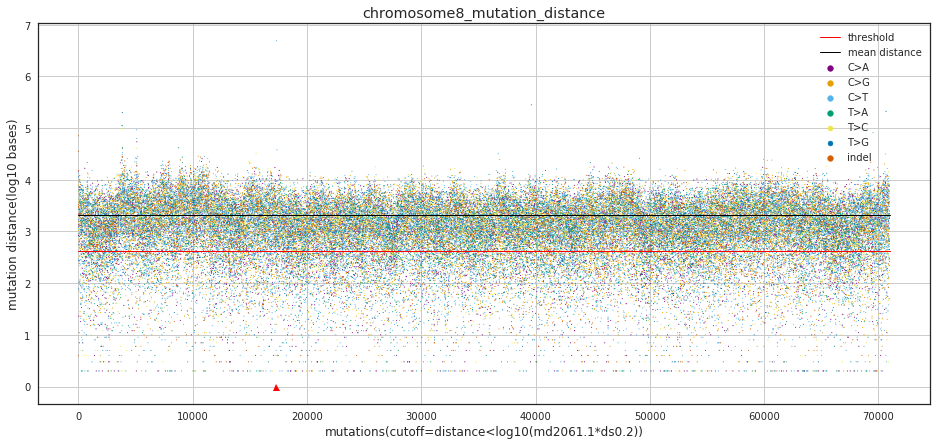

47953 47953
46700000 60300000
17962 17963
xxxx 17962 17963
0
1
2
3
4
5
6


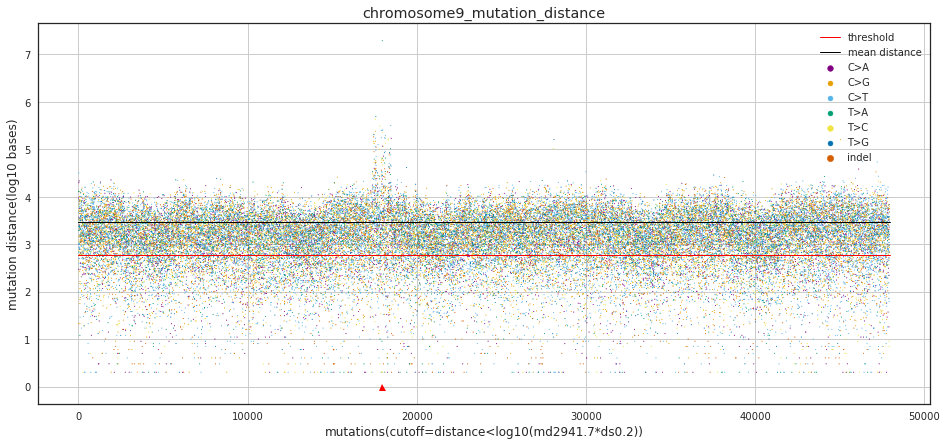

76271 76271
56600000 65000000
28341 28342
xxxx 28341 28342
0
1
2
3
4
5
6


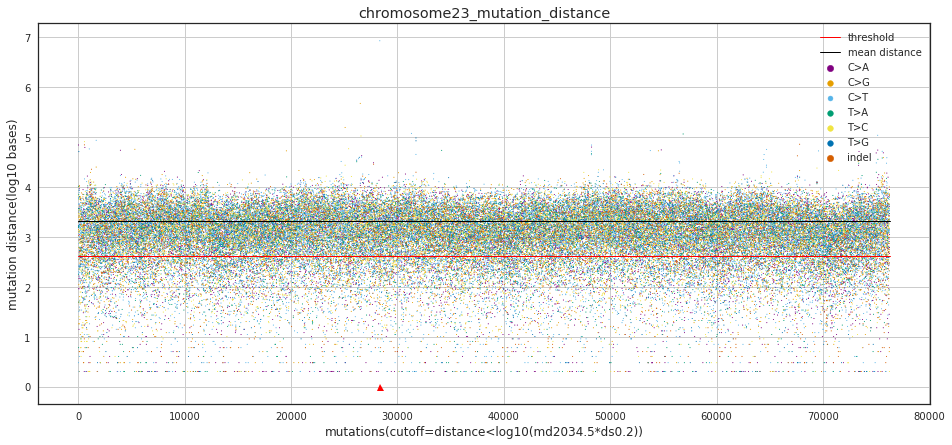

In [481]:
#  new testing, combine 6 type base change together

for chrm in chromosomes:#['21']:#
    with plt.style.context("seaborn-whitegrid"):
        plt.rcParams["axes.edgecolor"] = "0.15"
        plt.rcParams["axes.linewidth"]  = 1.25
        fig = plt.figure(facecolor='w', figsize=(16,7))
        ax = fig.add_subplot(111)
        
        qdf = tdf.query('chrom == "{}"'.format(chrm))
        rdf = qdf.groupby(['pos', 'snv2']).chrom.count().unstack()
        del rdf.index.name

#         print(rdf.head())
        snv_positions = qdf.pos.unique()
        snv_positions.sort()
        idxs = rdf.index.tolist()
        print(len(snv_positions), len(idxs))
        assert (snv_positions == idxs).all()
#         figure out the centromer position
#         centromeres contains centromere coordinates
        cen_start, cen_end = locate_centromere(centromeres, chrm, np.array(snv_positions))
        rdf = rdf.reset_index()
#         print(rdf.head())
        shifted_positions = shift(snv_positions, 1, cval=np.nan)
        dist = (snv_positions - shifted_positions)[1:]
        avg_distance = np.mean(dist)
        xmax = len(snv_positions)
        threshold = np.log10(avg_distance * distance_threshold)     
#         threshold = np.log10(avg_distance)/np.log10(5*avg_distance) 
        ax.plot((0, xmax), (threshold, threshold), 'r-', linewidth=1, label='threshold')
        avg_dist = np.log10(avg_distance)
        ax.plot((0, xmax), (avg_dist, avg_dist), 'k-', linewidth=1, label='mean distance')  
        print('xxxx', cen_start, cen_end)
#         ax.plot((cen_start, cen_end), (0.1, 0.1), 'r-', linewidth=14, label='centromere')
        ax.plot(cen_start, 0, 'r^')
        x1 = np.arange(len(dist))
        y1 = np.log10(dist+1)    
    #     plot different types of base changes
        mut_types = rdf.columns.tolist()
        mut_types.remove('index')
    #     mut_types = ['T>G']
        for k, mtype in enumerate(mut_types):
            print(k)
            sdf = rdf[mtype][1:].to_frame()
            x2 = sdf[sdf[mtype].notnull()].index.tolist()[:-1]
            y2 = y1[x2]
            z2 = sdf.loc[x2,mtype].tolist()
            ax.scatter(x2,y2, c=colors[k], marker='.', s=z2, label=mtype)
            plt.legend(loc='upper right', markerscale=8)
        plt.title('chromosome{}_mutation_distance'.format(chrm))
        plt.xlabel('mutations(cutoff=distance<log10(md{0:.1f}*ds{1:.1f}))'.format(avg_distance, distance_threshold))
        plt.ylabel('mutation distance(log10 bases)')
#         plt.ylim(0,50000)
#         dr = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/plots/'
        of = '{0}plots/chr{1}_mutation_distance_thr_{2}.png'.format(wkdir, chrm, distance_threshold)
        plt.savefig(of, dpi=200, bbox_inches='tight')
        plt.show()
        plt.close()

In [465]:
# count regions labelled as True/False with a distance less than threshold
def find_consecutive_regions(s, cth): #cth = count_threshold
    idx = 0
    out = []
    regions = []
    for k, g in groupby(s):
        element = next(g)
        nelements = len(list(g)) + 1
        if element and nelements > cth:
            l_nidx = idx
            h_nidx = idx + nelements -1
            l_idx = s.index[l_nidx]
            h_idx = s.index[h_nidx]
            rlen = h_idx - l_idx
            out.append((k, nelements, idx))
            regions.append([l_idx, h_idx, rlen, nelements])
        idx += nelements        
#     print(out)
#     print(regions)
    return regions
    
num = 1
s = pd.Series([False, True,True,True,False,False,True,True,False,True, False],
              index = [2,4,8,10,15, 16, 19, 22, 23,25,26])
# find_consecutive_regions(s, num)
assert find_consecutive_regions(s, num) == [[4, 10, 6, 3], [19, 22, 3, 2]]


In [466]:
df = tdf.copy()
rdf = pd.DataFrame()
for chrm in chromosomes:#['X']:#
    qdf = df.query('chrom == "{}"'.format(chrm))
    qdf = qdf.sort_values('pos')
#     print(qdf.head())
    qdf['shift_pos'] = qdf.pos.shift(1)
    qdf['distance'] = qdf.pos - qdf.shift_pos
    avg_distance = qdf.distance.mean()
    qdf['status'] = qdf.distance < distance_threshold * avg_distance
    print(chrm, avg_distance)
    qdf = qdf.set_index('pos')
#     print([ sum( 1 for x in group ) for key, group in itertools.groupby(qdf.status) if key])
    regions = find_consecutive_regions(qdf.status, count_threshold)
    odf = pd.DataFrame(regions, columns= ['start', 'end', 'region_length', 'number_non_coding_variants'])
    odf.insert(0, column='chr', value=chrm) 
    if rdf.empty:
         rdf = odf
    else:
        rdf = pd.concat([rdf, odf], axis=0)
rdf['xxx'] = rdf.number_non_coding_variants/rdf.region_length * 1000000
# replace infs with 10xmax, infs due to a recurrent variants at exactly the same coordinates
rdf['xxx'] = rdf['xxx'].replace(np.inf, rdf[rdf.xxx != np.inf].xxx.max() * 10 )
rdf['region_mutation_rate_Mb'] = rdf['xxx'].apply(int)
rdf.drop('xxx', axis=1, inplace=True)


of = '{0}/mutation_distance_d{1}_c{2}.txt'.format(wkdir, int(1/distance_threshold), count_threshold)
rdf.to_csv(of, sep='\t', index=False)
print(rdf)

1 2506.3776537436515
10 2374.0320386988224
11 2416.222122672783
12 2329.6533096494436
13 2404.8020272806907
14 2408.2693830734356
15 2638.3792563225375
16 2612.248718765382
17 2750.57707683968
18 2354.868075471698
19 2738.0730621143944
2 2272.933186270844
20 2178.355762570993
21 2560.3694933192223
22 2895.449456837217
3 2224.700237273269
4 2297.174436922041
5 2305.6869758074795
6 2358.9764340443157
7 2136.3618832755888
8 2056.1878390914458
9 2935.871295371295
23 2029.2523113941597
   chr      start        end  region_length  number_non_coding_variants  \
0    1    5135481    5136091            610                          12   
1    1   19502522   19503937           1415                           8   
2    1   23575058   23580539           5481                          33   
3    1   62480817   62482582           1765                          14   
4    1   72119459   72123060           3601                          22   
5    1   72123783   72125112           1329                     

CPU times: user 13 ms, sys: 999 µs, total: 14 ms
Wall time: 12.9 ms
-3.1792398100696717 1.4535365032490035


TypeError: unsupported operand type(s) for -: 'float' and 'decimal.Decimal'

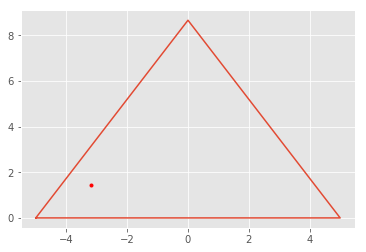

In [160]:
import math
import random
from decimal import Decimal
h = 10 * math.sin(math.radians(60))

%time plt.plot([-5, 5, 0, -5], [0, 0, h, 0]) # [x1, x2, x3, x4], [y1, y2, y3, y4]
# 
x = random.random()*10 -5
if x < 0:
    y = (h/5 * x + h) * random.random()
else:
    y = (-h/5 * x + h)* random.random()
print(x, y)
plt.plot(x, y, 'r.')

for m in range(100):
    point = random.randint(1,3)
    if point ==1:
        a = -5
        b = 0
    elif point == 2:
        a = 0
        b = h
    elif point == 3:
        a = 5
        b = 0
#     print(point)
    if point ==1 or point ==3:
        x = Decimal.from_float((a-x)/2 + x)
        y = Decimal.from_float(y/2)
    elif point ==2:
        x = Decimal.from_float(x/2)
        y = Decimal.from_float((b-x)/2 + x)
#     print(point, a, b, x, y)
    plt.plot(x, y, 'r.')


In [132]:
for x in range(100):
    x = random.random()*10 -5
    if x < 0:
        y = h/5 * x + h
    else:
        y = -h/5 * x + h
    print(x, y)



-2.513840073424137 4.306155308571103
4.342083308108517 1.1395451375036867
-0.15105549316257338 8.398618248924436
2.8509190690506045 3.7223173619817747
3.0752306807153484 3.3337982538507784
3.5489761263072115 2.513247072231314
-2.6874356371482744 4.0054789722323365
2.7693848972356268 3.863538690118366
-2.0835834404420472 5.051381657189598
4.3303166616345194 1.159925567031352
-3.8312088247402665 2.024405698987998
3.535597824214987 2.5364189711740526
-2.7547878346626753 3.88882154413598
3.93400890342739 1.8463507396798216
0.6043988245775935 7.613404565641084
0.7433159320493861 7.372793077459434
0.7708300469605911 7.325137232507938
-3.04544437197264 3.385389653963082
3.4904199751833698 2.61466930107349
-4.798550119358696 0.3489214284494242
-1.3004005692183265 6.407894181766755
-2.140716810317329 4.952423757757985
3.904588118247741 1.8973090344095436
-0.6194238194783539 7.5873805110895045
-4.902243399102363 0.16931939952993957
-4.107352396175586 1.5461110030784981
-4.545238938083394 0.78766